## Libraries

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import math
import calendar
import calendar
from datetime import datetime

In [ ]:
from sklearn import linear_model
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.ensemble import VotingRegressor

In [ ]:
import statsmodels.formula.api as sm
from statsmodels.tsa import tsatools, stattools
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics import tsaplots
from statsmodels.tsa.holtwinters import ExponentialSmoothing

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 12, 8
%matplotlib inline

In [ ]:
np.set_printoptions(precision=2)

In [ ]:
!pip install mlxtend

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pathlib import Path
import heapq
from collections import defaultdict
import pandas as pd
import matplotlib.pylab as plt
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [ ]:
!pip install dmba

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 11.8 MB 14.6 MB/s 


In [ ]:
from dmba import regressionSummary

no display found. Using non-interactive Agg backend


In [8]:
!pip install --upgrade plotly

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.2 MB 5.2 MB/s 
  Attempting uninstall: plotly
    Found existing installation: plotly 5.5.0
    Uninstalling plotly-5.5.0:
      Successfully uninstalled plotly-5.5.0


In [9]:
!pip install prophet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 8.9 MB 4.9 MB/s 
     |████████████████████████████████| 73 kB 1.2 MB/s 
     |████████████████████████████████| 179 kB 46.7 MB/s 
     |████████████████████████████████| 45 kB 2.7 MB/s 
  Attempting uninstall: holidays
    Found existing installation: holidays 0.10.5.2
    Uninstalling holidays-0.10.5.2:
      Successfully uninstalled holidays-0.10.5.2
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
fbprophet 0.7.1 requires cmdstanpy==0.9.5, but you have cmdstanpy 1.0.4 which is incompatible.


In [10]:
%load_ext rpy2.ipython
%matplotlib inline

from prophet import Prophet
import pandas as pd
import logging
import warnings

logging.getLogger('prophet').setLevel(logging.ERROR)
logging.getLogger('numexpr').setLevel(logging.ERROR)
warnings.filterwarnings("ignore")

The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Load data

In [12]:
df_sales_daily = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/salesdaily.csv')

In [13]:
df_sales_monthly = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/salesmonthly.csv')

In [14]:
df_sales_hourly = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/saleshourly.csv')

In [15]:
df_sales_weekly = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/salesweekly.csv')

In [ ]:
df_sales_daily.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014,1,248,Thursday
1,1/3/2014,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014,1,276,Friday
2,1/4/2014,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014,1,276,Saturday
3,1/5/2014,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014,1,276,Sunday
4,1/6/2014,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014,1,276,Monday


## Data Analysis

### M01AB drug by Weekday

In [ ]:
df_sales_daily_M01AB = df_sales_daily[['M01AB', 'Weekday Name']]
result_M01AB = df_sales_daily_M01AB.groupby(['Weekday Name'], as_index=False).sum().sort_values('M01AB', ascending=False)

In [ ]:
df_sales_daily_M01AB.head()

,M01AB,Weekday Name
0,0.0,Thursday
1,8.0,Friday
2,2.0,Saturday
3,4.0,Sunday
4,5.0,Monday


In [ ]:
result_day_M01AB = result_M01AB.iloc[0,0]

In [ ]:
result_value_M01AB = round(result_M01AB.iloc[0,1], 2)

In [ ]:
print('The 1st drug, M01AB, was most frequently sold on ' + str(result_day_M01AB) 
      + ' with the volume of ' + str(result_value_M01AB))

The 1st drug, M01AB, was most frequently sold on Saturday with the volume of 1724.05


### M01AE drug by Weekday

In [ ]:
df_sales_daily_M01AE = df_sales_daily[['M01AE', 'Weekday Name']]
result_M01AE = df_sales_daily_M01AE.groupby(['Weekday Name'], as_index=False).sum().sort_values('M01AE', ascending=False)

In [ ]:
result_day_M01AE = result_M01AE.iloc[0,0]

In [ ]:
result_value_M01AE = round(result_M01AE.iloc[0,1], 2)

In [ ]:
print('The 2nd drug, M01AE, was most frequently sold on ' + str(result_day_M01AE) 
      + ' with the volume of ' + str(result_value_M01AE))

The 2nd drug, M01AE, was most frequently sold on Sunday with the volume of 1384.94


### N02BA drug by Weekday

In [ ]:
df_sales_daily_N02BA = df_sales_daily[['N02BA', 'Weekday Name']]
result_N02BA = df_sales_daily_N02BA.groupby(['Weekday Name'], as_index=False).sum().sort_values('N02BA', ascending=False)

In [ ]:
result_day_N02BA = result_N02BA.iloc[0,0]

In [ ]:
result_value_N02BA = round(result_N02BA.iloc[0,1], 2)

In [ ]:
print('The 3rd drug, N02BA, was most frequently sold on ' + str(result_day_N02BA) 
      + ' with the volume of ' + str(result_value_N02BA))

The 3rd drug, N02BA, was most frequently sold on Tuesday with the volume of 1272.97


### N02BE drug by Weekday

In [ ]:
df_sales_daily_N02BE = df_sales_daily[['N02BE', 'Weekday Name']]
result_N02BE = df_sales_daily_N02BE.groupby(['Weekday Name'], as_index=False).sum().sort_values('N02BE', ascending=False)

In [ ]:
result_day_N02BE = result_N02BE.iloc[0,0]

In [ ]:
result_value_N02BE = round(result_N02BE.iloc[0,1], 2)

In [ ]:
print('The 4th drug, N02BE, was most frequently sold on ' + str(result_day_N02BE) 
      + ' with the volume of ' + str(result_value_N02BE))

The 4th drug, N02BE, was most frequently sold on Saturday with the volume of 10107.5


### N05B drug by Weekday

In [ ]:
df_sales_daily_N05B = df_sales_daily[['N05B', 'Weekday Name']]
result_N05B = df_sales_daily_N05B.groupby(['Weekday Name'], as_index=False).sum().sort_values('N05B', ascending=False)

In [ ]:
result_day_N05B = result_N05B.iloc[0,0]

In [ ]:
result_value_N05B = round(result_N05B.iloc[0,1], 2)

In [ ]:
print('The 5th drug, N05B, was most frequently sold on ' + str(result_day_N05B) 
      + ' with the volume of ' + str(result_value_N05B))

The 5th drug, N05B, was most frequently sold on Wednesday with the volume of 3037.18


### N05C drug by Weekday

In [ ]:
df_sales_daily_N05C = df_sales_daily[['N05C', 'Weekday Name']]
result_N05C = df_sales_daily_N05C.groupby(['Weekday Name'], as_index=False).sum().sort_values('N05C', ascending=False)

In [ ]:
result_day_N05C = result_N05C.iloc[0,0]

In [ ]:
result_value_N05C = round(result_N05C.iloc[0,1], 2)

In [ ]:
print('The 6th drug, N05C, was most frequently sold on ' + str(result_day_N05C) 
      + ' with the volume of ' + str(result_value_N05C))

The 6th drug, N05C, was most frequently sold on Friday with the volume of 229.5


### R03 drug by Weekday

In [ ]:
df_sales_daily_R03 = df_sales_daily[['R03', 'Weekday Name']]
result_R03 = df_sales_daily_R03.groupby(['Weekday Name'], as_index=False).sum().sort_values('R03', ascending=False)

In [ ]:
result_day_R03 = result_R03.iloc[0,0]

In [ ]:
result_value_R03 = round(result_R03.iloc[0,1], 2)

In [ ]:
print('The 7th drug, R03, was most frequently sold on ' + str(result_day_R03) 
      + ' with the volume of ' + str(result_value_R03))

The 7th drug, R03, was most frequently sold on Monday with the volume of 1791.46


### R06 drug by Weekday

In [ ]:
df_sales_daily_R06 = df_sales_daily[['R06', 'Weekday Name']]
result_R06 = df_sales_daily_R06.groupby(['Weekday Name'], as_index=False).sum().sort_values('R06', ascending=False)

In [ ]:
result_day_R06 = result_R06.iloc[0,0]

In [ ]:
result_value_R06 = round(result_R06.iloc[0,1], 2)

In [ ]:
print('The 8th drug, R06, was most frequently sold on ' + str(result_day_R06) 
      + ' with the volume of ' + str(result_value_R06))

The 8th drug, R06, was most frequently sold on Saturday with the volume of 986.46


## Top 3 drugs gaving the largest sales in January 2015, July 2016, September 2017

In [ ]:
df_sales_monthly.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,2014-01-31,127.69,99.090,152.100,878.030,354.0,50.0,112.0,48.2
1,2014-02-28,133.32,126.050,177.000,1001.900,347.0,31.0,122.0,36.2
2,2014-03-31,137.44,92.950,147.655,779.275,232.0,20.0,112.0,85.4
3,2014-04-30,113.10,89.475,130.900,698.500,209.0,18.0,97.0,73.7
4,2014-05-31,101.79,119.933,132.100,628.780,270.0,23.0,107.0,123.7


In [ ]:
def top_3_drugs_by_month(month, year):
    month = str(month) if (month > 9) else '0' + str(month)
    year = str(year)

    # Filter by Date
    sales = df_sales_monthly.loc[df_sales_monthly['datum'].str.contains('^' + year + '\-' + month + '' , flags=re.I, regex=True)]
    
    # Reset index
    sales = sales.reset_index()
    
    # Filter chosen drugs
    top_Sales_by_Product = sales[['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']]
    
    # Sort values horizontally in descending order
    top_Sales_by_Product = top_Sales_by_Product.sort_values(by=0, ascending=False, axis=1)
    
    # Print results
    print('Top 3 Drugs by Sale in ' + calendar.month_name[int(month)] + ' ' + year)
    for drug in top_Sales_by_Product.columns.values[0:3]:
        print(' - Product: ' + str(drug) + ', Volume sold: ' + str(round(top_Sales_by_Product[drug].iloc[0], 2)))
    print("\n")

In [ ]:
# Top 3 Drugs by Sale in January 2014
top_3_drugs_by_month(1, 2014)

# Top 3 Drugs by Sale in January 2015
top_3_drugs_by_month(1, 2015)

# Top 3 Drugs by Sale in July 2016
top_3_drugs_by_month(7, 2016)

# Top 3 Drugs by Sale in September 2017
top_3_drugs_by_month(9, 2017)

Top 3 Drugs by Sale in January 2014
 - Product: N02BE, Volume sold: 878.03
 - Product: N05B, Volume sold: 354.0
 - Product: N02BA, Volume sold: 152.1


Top 3 Drugs by Sale in January 2015
 - Product: N02BE, Volume sold: 1044.24
 - Product: N05B, Volume sold: 463.0
 - Product: R03, Volume sold: 177.25


Top 3 Drugs by Sale in July 2016
 - Product: N02BE, Volume sold: 652.36
 - Product: N05B, Volume sold: 240.0
 - Product: M01AB, Volume sold: 203.97


Top 3 Drugs by Sale in September 2017
 - Product: N02BE, Volume sold: 863.75
 - Product: N05B, Volume sold: 223.0
 - Product: R03, Volume sold: 139.0




## Top 1 Drug sold on Mondays in years

In [ ]:
df_sales_daily = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/salesdaily.csv')

In [ ]:
df_sales_daily.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014,1,248,Thursday
1,1/3/2014,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014,1,276,Friday
2,1/4/2014,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014,1,276,Saturday
3,1/5/2014,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014,1,276,Sunday
4,1/6/2014,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014,1,276,Monday


### 2014

In [ ]:
df_sales_daily_2014 = df_sales_daily.loc[df_sales_daily['datum'].str.contains('2014', flags=re.I, regex=True) & (df_sales_daily['Weekday Name'] == 'Monday')]

In [ ]:
df_sales_daily_2014 = df_sales_daily_2014.groupby(['Weekday Name'], as_index=False).sum()

In [ ]:
df_sales_daily_2014 = df_sales_daily_2014[['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']]
result_2014 = df_sales_daily_2014.sort_values(by=0, ascending=False, axis=1)
for field in result_2014.columns.values[0:1]:
    print('The most frequently sold Drug on Mondays in 2014 is ' + str(field) + ' with the Volume of ' + str(round(result_2014[field].iloc[0], 2)))

The most frequently sold Drug on Mondays in 2014 is N02BE with the Volume of 1337.46


### 2015

In [ ]:
df_sales_daily_2015 = df_sales_daily.loc[df_sales_daily['datum'].str.contains('2015', flags=re.I, regex=True) & (df_sales_daily['Weekday Name'] == 'Monday')]

In [ ]:
df_sales_daily_2015 = df_sales_daily_2015.groupby(['Weekday Name'], as_index=False).sum()

In [ ]:
df_sales_daily_2015 = df_sales_daily_2015[['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']]
result_2015 = df_sales_daily_2015.sort_values(by=0, ascending=False, axis=1)
for field in result_2015.columns.values[0:1]:
    print('The most frequently sold Drug on Mondays in 2015 is ' + str(field) + ' with the Volume of ' + str(round(result_2015[field].iloc[0], 2)))

The most frequently sold Drug on Mondays in 2015 is N02BE with the Volume of 1915.91


### 2016

In [ ]:
df_sales_daily_2016 = df_sales_daily.loc[df_sales_daily['datum'].str.contains('2016', flags=re.I, regex=True) & (df_sales_daily['Weekday Name'] == 'Monday')]

In [ ]:
df_sales_daily_2016 = df_sales_daily_2016.groupby(['Weekday Name'], as_index=False).sum()

In [ ]:
df_sales_daily_2016 = df_sales_daily_2016[['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']]
result_2016 = df_sales_daily_2016.sort_values(by=0, ascending=False, axis=1)
for field in result_2016.columns.values[0:1]:
    print('The most frequently sold Drug on Mondays in 2016 is ' + str(field) + ' with the Volume of ' + str(round(result_2016[field].iloc[0], 2)))

The most frequently sold Drug on Mondays in 2016 is N02BE with the Volume of 1724.8


### 2017

#### Filter out all except Mondays in 2017

In [ ]:
df_sales_daily_2017 = df_sales_daily.loc[df_sales_daily['datum'].str.contains('2017', flags=re.I, regex=True) & (df_sales_daily['Weekday Name'] == 'Monday')]

#### Group by Weekday and Sum up

In [ ]:
df_sales_daily_2017 = df_sales_daily_2017.groupby(['Weekday Name'], as_index=False).sum()

#### Filter by the chosen Drugs and Sort by descending order

In [ ]:
df_sales_daily_2017 = df_sales_daily_2017[['M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06']]
result_2017 = df_sales_daily_2017.sort_values(by=0, ascending=False, axis=1)

In [ ]:
for field in result_2017.columns.values[0:1]:
    print('The most frequently sold Drug on Mondays in 2017 is ' + str(field) + ' with the Volume of ' + str(round(result_2017[field].iloc[0], 2)))

The most frequently sold Drug on Mondays in 2017 is N02BE with the Volume of 1160.56


## Pharmaceutical Portfolio Management Analysis

### Volatility and Risk

The volatility is measured by the average squared deviation from the mean, which is the standard deviation.

In [ ]:
df_sales_daily.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014,1,248,Thursday
1,1/3/2014,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014,1,276,Friday
2,1/4/2014,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014,1,276,Saturday
3,1/5/2014,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014,1,276,Sunday
4,1/6/2014,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014,1,276,Monday


In [ ]:
returns = df_sales_daily[["M01AB", "M01AE", "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]].pct_change()
returns

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,inf,0.089918,0.294118,0.561728,1.285714,NaN,inf,1.000000
2,-0.750000,-0.750000,0.477273,0.222332,-0.375000,NaN,-0.550000,-0.750000
3,1.000000,2.000000,0.076923,-0.335489,-0.200000,NaN,-0.666667,-1.000000
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,inf,1.000000,inf
...,...,...,...,...,...,...,...,...
2101,0.468000,0.894333,-0.437500,-0.444307,0.300000,NaN,-0.500000,-0.500000
2102,-0.476839,-0.118423,1.666667,0.131403,-0.461538,NaN,-1.000000,-0.670000
2103,0.041667,1.333333,-0.666667,0.362205,-0.142857,NaN,inf,11.727273
2104,0.835000,-0.614457,0.500000,0.468208,0.000000,NaN,1.000000,-0.761905


In [ ]:
returns = returns.dropna()
returns

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,inf,1.000000,inf
5,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.00,-1.000000,-1.000000
7,0.313321,-0.440000,-0.238095,-0.053030,-0.157895,-1.00,-0.700000,inf
8,-0.285714,0.190476,-0.750000,1.132000,-0.062500,inf,-1.000000,0.000000
9,0.000000,1.170000,4.200000,-0.018762,-0.066667,-1.00,inf,-0.900000
...,...,...,...,...,...,...,...,...
2093,-0.083333,-0.173569,-0.523810,-0.046154,-0.071429,-1.00,20.882353,-1.000000
2098,4.670000,0.671994,-0.952381,-0.048583,0.666667,inf,2.400000,-0.250000
2099,-0.543210,0.360765,27.000000,-0.357447,-0.400000,-0.75,-1.000000,-0.266667
2100,-0.034749,-0.083690,0.428571,0.337748,0.111111,-1.00,inf,0.818182


In [ ]:
returns.replace([np.inf, -np.inf], 0, inplace=True)
returns

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,0.00,1.000000,0.000000
5,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.00,-1.000000,-1.000000
7,0.313321,-0.440000,-0.238095,-0.053030,-0.157895,-1.00,-0.700000,0.000000
8,-0.285714,0.190476,-0.750000,1.132000,-0.062500,0.00,-1.000000,0.000000
9,0.000000,1.170000,4.200000,-0.018762,-0.066667,-1.00,0.000000,-0.900000
...,...,...,...,...,...,...,...,...
2093,-0.083333,-0.173569,-0.523810,-0.046154,-0.071429,-1.00,20.882353,-1.000000
2098,4.670000,0.671994,-0.952381,-0.048583,0.666667,0.00,2.400000,-0.250000
2099,-0.543210,0.360765,27.000000,-0.357447,-0.400000,-0.75,-1.000000,-0.266667
2100,-0.034749,-0.083690,0.428571,0.337748,0.111111,-1.00,0.000000,0.818182


In [ ]:
returns.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1018 entries, 4 to 2105
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   M01AB   1018 non-null   float64
 1   M01AE   1018 non-null   float64
 2   N02BA   1018 non-null   float64
 3   N02BE   1018 non-null   float64
 4   N05B    1018 non-null   float64
 5   N05C    1018 non-null   float64
 6   R03     1018 non-null   float64
 7   R06     1018 non-null   float64
dtypes: float64(8)
memory usage: 71.6 KB


In [ ]:
returns.describe()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
count,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000
mean,0.467865,0.771006,0.494883,0.118574,0.452680,-0.333674,0.609728,0.228516
std,1.939660,6.853426,2.201483,0.592521,2.215309,0.745099,3.096448,1.240944
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-0.400973,-0.388088,-0.432615,-0.266426,-0.363636,-1.000000,-0.800000,-0.500000
50%,0.000000,0.000469,0.000000,-0.012757,0.000000,0.000000,0.000000,0.000000
75%,0.653284,0.608094,0.623162,0.346937,0.639091,0.000000,0.452020,0.500000
max,28.411765,175.969697,27.000000,3.529801,53.833333,6.000000,34.000000,9.000000


In [ ]:
deviations = returns - returns.mean()
squared_deviations = deviations**2
mean_squared_deviations = squared_deviations.mean()

volatility = np.sqrt(mean_squared_deviations)
volatility

M01AB    1.938707
M01AE    6.850059
N02BA    2.200402
N02BE    0.592230
N05B     2.214221
N05C     0.744733
R03      3.094927
R06      1.240334
dtype: float64

In [ ]:
returns.std()

M01AB    1.939660
M01AE    6.853426
N02BA    2.201483
N02BE    0.592521
N05B     2.215309
N05C     0.745099
R03      3.096448
R06      1.240944
dtype: float64

In [ ]:
returns.shape

(1018, 8)

In [ ]:
number_of_obs = returns.shape[0]
mean_squared_deviations = squared_deviations.sum()/(number_of_obs-1)
volatility = np.sqrt(mean_squared_deviations)
volatility

M01AB    1.939660
M01AE    6.853426
N02BA    2.201483
N02BE    0.592521
N05B     2.215309
N05C     0.745099
R03      3.096448
R06      1.240944
dtype: float64

In [ ]:
returns.std()

M01AB    1.939660
M01AE    6.853426
N02BA    2.201483
N02BE    0.592521
N05B     2.215309
N05C     0.745099
R03      3.096448
R06      1.240944
dtype: float64

### Annualizing Volatility


I annualize volatility by scaling (multiplying) it by the square root of the number of periods per observation

Therefore, to annualize the volatility of a monthly series, I muiltiply it by the square root of 12. Instead of using the `np.sqrt()` I can raise it to the power of $0.5$

In [ ]:
annualized_vol = returns.std()*(12**0.5)
annualized_vol

M01AB     6.719179
M01AE    23.740963
N02BA     7.626162
N02BE     2.052553
N05B      7.674055
N05C      2.581097
R03      10.726412
R06       4.298756
dtype: float64

### Risk Adjusted Returns

In [ ]:
returns_plot = returns/100

In [ ]:
returns_plot

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
4,0.002500,-0.006667,-0.003571,-0.004720,0.010000,0.0000,0.010000,0.000000
5,-0.010000,-0.010000,-0.010000,-0.010000,-0.010000,-0.0100,-0.010000,-0.010000
7,0.003133,-0.004400,-0.002381,-0.000530,-0.001579,-0.0100,-0.007000,0.000000
8,-0.002857,0.001905,-0.007500,0.011320,-0.000625,0.0000,-0.010000,0.000000
9,0.000000,0.011700,0.042000,-0.000188,-0.000667,-0.0100,0.000000,-0.009000
...,...,...,...,...,...,...,...,...
2093,-0.000833,-0.001736,-0.005238,-0.000462,-0.000714,-0.0100,0.208824,-0.010000
2098,0.046700,0.006720,-0.009524,-0.000486,0.006667,0.0000,0.024000,-0.002500
2099,-0.005432,0.003608,0.270000,-0.003574,-0.004000,-0.0075,-0.010000,-0.002667
2100,-0.000347,-0.000837,0.004286,0.003377,0.001111,-0.0100,0.000000,0.008182


In [ ]:
returns_plot.describe()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
count,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000,1018.000000
mean,0.004679,0.007710,0.004949,0.001186,0.004527,-0.003337,0.006097,0.002285
std,0.019397,0.068534,0.022015,0.005925,0.022153,0.007451,0.030964,0.012409
min,-0.010000,-0.010000,-0.010000,-0.010000,-0.010000,-0.010000,-0.010000,-0.010000
25%,-0.004010,-0.003881,-0.004326,-0.002664,-0.003636,-0.010000,-0.008000,-0.005000
50%,0.000000,0.000005,0.000000,-0.000128,0.000000,0.000000,0.000000,0.000000
75%,0.006533,0.006081,0.006232,0.003469,0.006391,0.000000,0.004520,0.005000
max,0.284118,1.759697,0.270000,0.035298,0.538333,0.060000,0.340000,0.090000


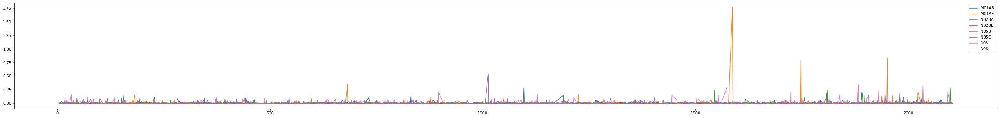

In [ ]:
plt.rcParams["figure.figsize"] = (45,5)
returns_plot.plot()

In [ ]:
annualized_vol = returns.std()*np.sqrt(12)
annualized_vol

M01AB     6.719179
M01AE    23.740963
N02BA     7.626162
N02BE     2.052553
N05B      7.674055
N05C      2.581097
R03      10.726412
R06       4.298756
dtype: float64

In [ ]:
returns.shape[0]

1018

In [ ]:
annualized_vol = returns.std()*(12**0.5)
annualized_vol

M01AB     6.719179
M01AE    23.740963
N02BA     7.626162
N02BE     2.052553
N05B      7.674055
N05C      2.581097
R03      10.726412
R06       4.298756
dtype: float64

In [ ]:
n_months = 3
return_per_month = (returns+1).prod()**(1/n_months) - 1
return_per_month

M01AB   -1.0
M01AE   -1.0
N02BA   -1.0
N02BE   -1.0
N05B    -1.0
N05C    -1.0
R03     -1.0
R06     -1.0
dtype: float64

In [ ]:
annualized_return = (return_per_month + 1)**12-1

In [ ]:
annualized_return = (returns+1).prod()**(12/n_months) - 1
annualized_return

M01AB   -1.0
M01AE   -1.0
N02BA   -1.0
N02BE   -1.0
N05B    -1.0
N05C    -1.0
R03     -1.0
R06     -1.0
dtype: float64

In [ ]:
annualized_return/annualized_vol

M01AB   -0.148828
M01AE   -0.042121
N02BA   -0.131128
N02BE   -0.487198
N05B    -0.130309
N05C    -0.387432
R03     -0.093228
R06     -0.232625
dtype: float64

In [ ]:
riskfree_rate = 0.03
excess_return = annualized_return - riskfree_rate
sharpe_ratio = excess_return/annualized_vol
sharpe_ratio

M01AB   -0.153293
M01AE   -0.043385
N02BA   -0.135061
N02BE   -0.501814
N05B    -0.134218
N05C    -0.399055
R03     -0.096025
R06     -0.239604
dtype: float64

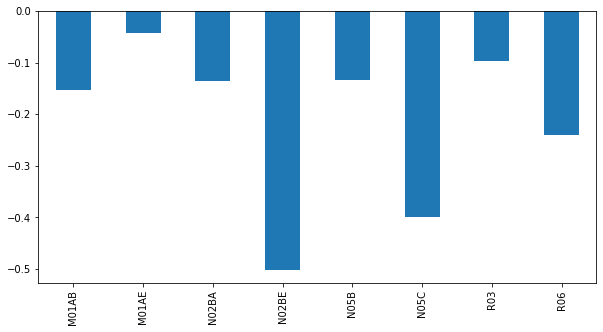

In [ ]:
plt.rcParams["figure.figsize"] = (10,5)
sharpe_ratio.plot.bar()

### Computing Drawdowns

1. Convert the time series of returns to a time series that represents a wealth index
2. Compute a time series of the previous peaks
3. Compute the Drawdown as the difference between the previous peak and the current value

Let's do this for M01AB stocks.

In [ ]:
df_sales_daily

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00,2014,1,248,Thursday
1,1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00,2014,1,276,Friday
2,1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00,2014,1,276,Saturday
3,1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00,2014,1,276,Sunday
4,1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00,2014,1,276,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00,2019,10,276,Friday
2102,10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33,2019,10,276,Saturday
2103,10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20,2019,10,276,Sunday
2104,10/7/2019,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00,2019,10,276,Monday


In [ ]:
rets = df_sales_daily[["datum", "M01AB", "M01AE", "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]]
rets

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00
1,1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00
2,1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00
3,1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00
4,1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...,...
2101,10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00
2102,10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33
2103,10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20
2104,10/7/2019,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00


In [ ]:
rets['Date'] = pd.to_datetime(rets.datum, format='%m/%d/%Y')
rets.head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Date
0,1/2/2014,0.00,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014-01-02
1,1/3/2014,8.00,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014-01-03
2,1/4/2014,2.00,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014-01-04
3,1/5/2014,4.00,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014-01-05
4,1/6/2014,5.00,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014-01-06
5,1/7/2014,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,2014-01-07
6,1/8/2014,5.33,3.00,10.5,26.40,19.0,1.0,10.0,0.0,2014-01-08
7,1/9/2014,7.00,1.68,8.0,25.00,16.0,0.0,3.0,2.0,2014-01-09
8,1/10/2014,5.00,2.00,2.0,53.30,15.0,2.0,0.0,2.0,2014-01-10
9,1/11/2014,5.00,4.34,10.4,52.30,14.0,0.0,1.0,0.2,2014-01-11


In [ ]:
rets['Date 1'] = rets['Date'].dt.strftime('%Y%m%d')
rets

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Date,Date 1
0,1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00,2014-01-02,20140102
1,1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00,2014-01-03,20140103
2,1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00,2014-01-04,20140104
3,1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00,2014-01-05,20140105
4,1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00,2014-01-06,20140106
...,...,...,...,...,...,...,...,...,...,...,...
2101,10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00,2019-10-04,20191004
2102,10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33,2019-10-05,20191005
2103,10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20,2019-10-06,20191006
2104,10/7/2019,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00,2019-10-07,20191007


In [ ]:
date_temp = rets[["Date 1"]]

In [ ]:
rets = rets[["M01AB", "M01AE", "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]]
rets

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00
1,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00
2,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00
3,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00
4,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
2101,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00
2102,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33
2103,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20
2104,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00


In [ ]:
rets = rets.pct_change()

In [ ]:
rets

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,inf,0.089918,0.294118,0.561728,1.285714,NaN,inf,1.000000
2,-0.750000,-0.750000,0.477273,0.222332,-0.375000,NaN,-0.550000,-0.750000
3,1.000000,2.000000,0.076923,-0.335489,-0.200000,NaN,-0.666667,-1.000000
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,inf,1.000000,inf
...,...,...,...,...,...,...,...,...
2101,0.468000,0.894333,-0.437500,-0.444307,0.300000,NaN,-0.500000,-0.500000
2102,-0.476839,-0.118423,1.666667,0.131403,-0.461538,NaN,-1.000000,-0.670000
2103,0.041667,1.333333,-0.666667,0.362205,-0.142857,NaN,inf,11.727273
2104,0.835000,-0.614457,0.500000,0.468208,0.000000,NaN,1.000000,-0.761905


In [ ]:
rets = rets.iloc[1: , :]

In [ ]:
rets.replace([np.inf, -np.inf, np.nan], 0, inplace=True)
rets

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,


,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
1,0.000000,0.089918,0.294118,0.561728,1.285714,0.0,0.000000,1.000000
2,-0.750000,-0.750000,0.477273,0.222332,-0.375000,0.0,-0.550000,-0.750000
3,1.000000,2.000000,0.076923,-0.335489,-0.200000,0.0,-0.666667,-1.000000
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,0.0,1.000000,0.000000
5,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.000000
...,...,...,...,...,...,...,...,...
2101,0.468000,0.894333,-0.437500,-0.444307,0.300000,0.0,-0.500000,-0.500000
2102,-0.476839,-0.118423,1.666667,0.131403,-0.461538,0.0,-1.000000,-0.670000
2103,0.041667,1.333333,-0.666667,0.362205,-0.142857,0.0,0.000000,11.727273
2104,0.835000,-0.614457,0.500000,0.468208,0.000000,0.0,1.000000,-0.761905


In [ ]:
date_temp

,Date 1
0,20140102
1,20140103
2,20140104
3,20140105
4,20140106
...,...
2101,20191004
2102,20191005
2103,20191006
2104,20191007


In [ ]:
rets2 = pd.concat([rets, date_temp], axis=1, join="inner")
rets2

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Date 1
1,0.000000,0.089918,0.294118,0.561728,1.285714,0.0,0.000000,1.000000,20140103
2,-0.750000,-0.750000,0.477273,0.222332,-0.375000,0.0,-0.550000,-0.750000,20140104
3,1.000000,2.000000,0.076923,-0.335489,-0.200000,0.0,-0.666667,-1.000000,20140105
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,0.0,1.000000,0.000000,20140106
5,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.000000,20140107
...,...,...,...,...,...,...,...,...,...
2101,0.468000,0.894333,-0.437500,-0.444307,0.300000,0.0,-0.500000,-0.500000,20191004
2102,-0.476839,-0.118423,1.666667,0.131403,-0.461538,0.0,-1.000000,-0.670000,20191005
2103,0.041667,1.333333,-0.666667,0.362205,-0.142857,0.0,0.000000,11.727273,20191006
2104,0.835000,-0.614457,0.500000,0.468208,0.000000,0.0,1.000000,-0.761905,20191007


In [ ]:
rets2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2105 entries, 1 to 2105
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   M01AB   2105 non-null   float64
 1   M01AE   2105 non-null   float64
 2   N02BA   2105 non-null   float64
 3   N02BE   2105 non-null   float64
 4   N05B    2105 non-null   float64
 5   N05C    2105 non-null   float64
 6   R03     2105 non-null   float64
 7   R06     2105 non-null   float64
 8   Date 1  2105 non-null   object 
dtypes: float64(8), object(1)
memory usage: 148.1+ KB


In [ ]:
rets2['Date']=pd.to_datetime(rets2['Date 1'],format='%Y%m%d')
rets2

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Date 1,Date
1,0.000000,0.089918,0.294118,0.561728,1.285714,0.0,0.000000,1.000000,20140103,2014-01-03
2,-0.750000,-0.750000,0.477273,0.222332,-0.375000,0.0,-0.550000,-0.750000,20140104,2014-01-04
3,1.000000,2.000000,0.076923,-0.335489,-0.200000,0.0,-0.666667,-1.000000,20140105,2014-01-05
4,0.250000,-0.666667,-0.357143,-0.472019,1.000000,0.0,1.000000,0.000000,20140106,2014-01-06
5,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.000000,20140107,2014-01-07
...,...,...,...,...,...,...,...,...,...,...
2101,0.468000,0.894333,-0.437500,-0.444307,0.300000,0.0,-0.500000,-0.500000,20191004,2019-10-04
2102,-0.476839,-0.118423,1.666667,0.131403,-0.461538,0.0,-1.000000,-0.670000,20191005,2019-10-05
2103,0.041667,1.333333,-0.666667,0.362205,-0.142857,0.0,0.000000,11.727273,20191006,2019-10-06
2104,0.835000,-0.614457,0.500000,0.468208,0.000000,0.0,1.000000,-0.761905,20191007,2019-10-07


In [ ]:
rets2 = rets2.groupby([rets2.Date.dt.year, rets2.Date.dt.month]).last()
rets2

M01AB     M01AE     N02BA     N02BE      N05B  N05C       R03  \
Date Date                                                                     
2014 1    -0.668874  1.000000  1.958333  0.054902  0.285714  -1.0 -0.666667   
     2     1.333333  0.160883  0.325000  0.114458  0.500000   0.0  0.000000   
     3     0.780000  0.000000  0.000000  0.283333  0.500000   0.0  0.000000   
     4     0.303303 -0.333333  0.590909  0.422442  0.833333  -1.0  0.400000   
     5     0.877483  0.653465  0.000000  0.302326 -0.285714   0.0  0.000000   
...             ...       ...       ...       ...       ...   ...       ...   
2019 6     4.084746  0.080526 -1.000000  1.185792  1.500000   0.0  1.200000   
     7    -1.000000 -0.540973 -0.600000  0.105263 -0.555556  -1.0 -0.878788   
     8    -0.261830  2.727273  0.000000 -0.210526  0.666667   0.0  1.000000   
     9    -0.430199 -0.627877 -0.300000 -0.271386  0.500000   0.0  0.666667   
     10   -0.955041 -0.616153 -0.833333 -0.127953  2.333333   0.0 -0.800000   

                R06    Date 1       Date  
Date Date                                 
2014 1    -1.000000  20140131 2014-01-31  
     2    -1.000000  20140228 2014-02-28  
     3    -0.142857  20140331 2014-03-31  
     4     9.000000  20140430 2014-04-30  
     5    -0.600000  20140531 2014-05-31  
...             ...       ...        ...  
2019 6     1.500000  20190630 2019-06-30  
     7    -0.600000  20190731 2019-07-31  
     8     0.176471  20190831 2019-08-31  
     9    -0.047619  20190930 2019-09-30  
     10   -1.000000  20191008 2019-10-08  

[70 rows x 10 columns]

In [ ]:
rets2 = rets2.set_index('Date')
rets2

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Date 1
Date,,,,,,,,,
2014-01-31,-0.668874,1.000000,1.958333,0.054902,0.285714,-1.0,-0.666667,-1.000000,20140131
2014-02-28,1.333333,0.160883,0.325000,0.114458,0.500000,0.0,0.000000,-1.000000,20140228
2014-03-31,0.780000,0.000000,0.000000,0.283333,0.500000,0.0,0.000000,-0.142857,20140331
2014-04-30,0.303303,-0.333333,0.590909,0.422442,0.833333,-1.0,0.400000,9.000000,20140430
2014-05-31,0.877483,0.653465,0.000000,0.302326,-0.285714,0.0,0.000000,-0.600000,20140531
...,...,...,...,...,...,...,...,...,...
2019-06-30,4.084746,0.080526,-1.000000,1.185792,1.500000,0.0,1.200000,1.500000,20190630
2019-07-31,-1.000000,-0.540973,-0.600000,0.105263,-0.555556,-1.0,-0.878788,-0.600000,20190731
2019-08-31,-0.261830,2.727273,0.000000,-0.210526,0.666667,0.0,1.000000,0.176471,20190831


#### M01AB

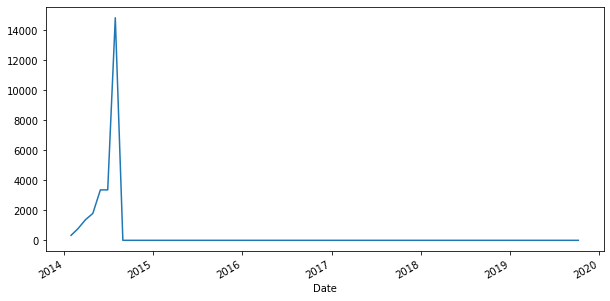

In [ ]:
wealth_index = 1000*(1+rets2["M01AB"]).cumprod()
wealth_index.plot()

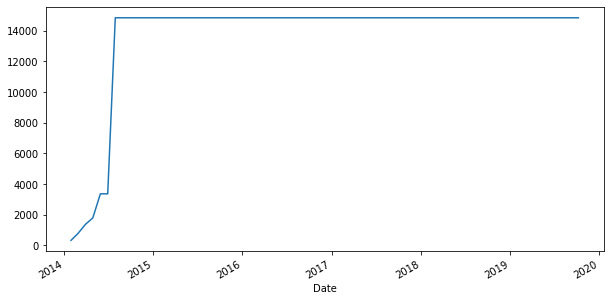

In [ ]:
previous_peaks = wealth_index.cummax()
previous_peaks.plot()

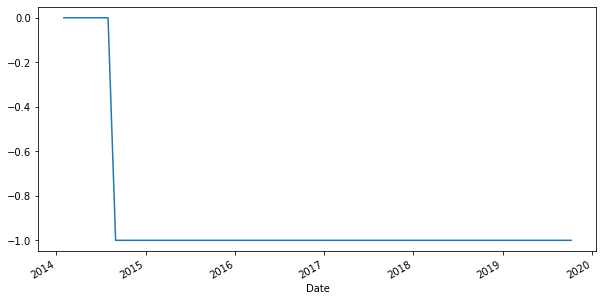

In [ ]:
drawdown = (wealth_index - previous_peaks)/previous_peaks
drawdown.plot()

In [ ]:
drawdown.min()

-1.0

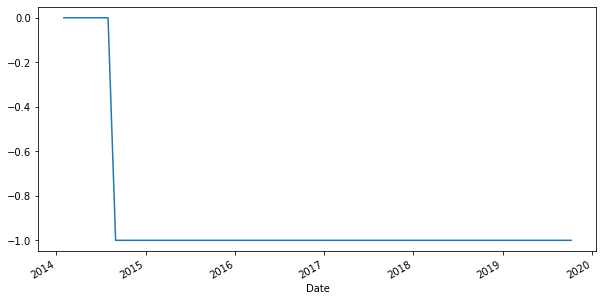

In [ ]:
drawdown["2014":].plot()

In [ ]:
drawdown_M01AE["2014":].min()

-0.9997572623385805

#### M01AE

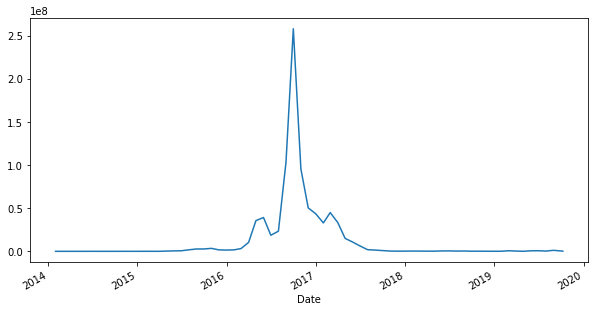

In [ ]:
wealth_index_M01AE = 1000*(1+rets2["M01AE"]).cumprod()
wealth_index_M01AE.plot()

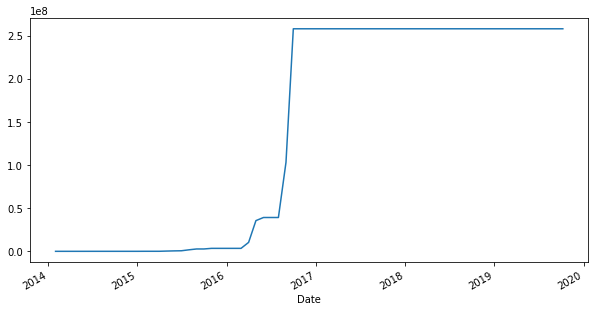

In [ ]:
previous_peaks_M01AE = wealth_index_M01AE.cummax()
previous_peaks_M01AE.plot()

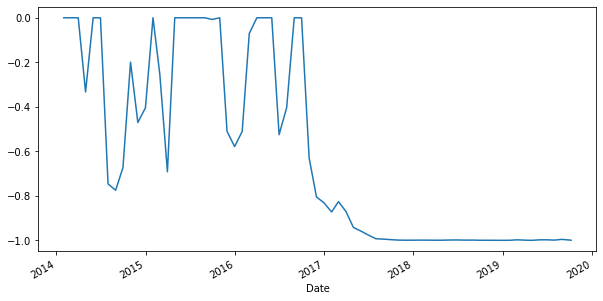

In [ ]:
drawdown_M01AE = (wealth_index_M01AE - previous_peaks_M01AE)/previous_peaks_M01AE
drawdown_M01AE.plot()

In [ ]:
drawdown_M01AE.min()

-0.9997572623385805

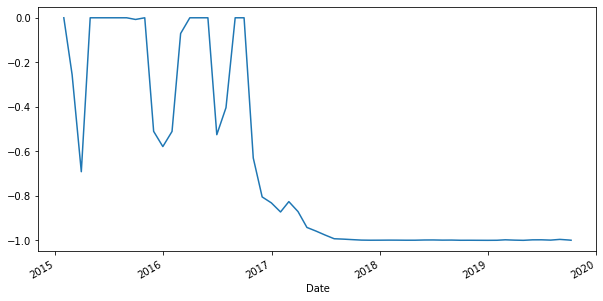

In [ ]:
drawdown_M01AE["2015":].plot()

In [ ]:
drawdown_M01AE["2016":].min()

-0.9997572623385805

#### N02BA

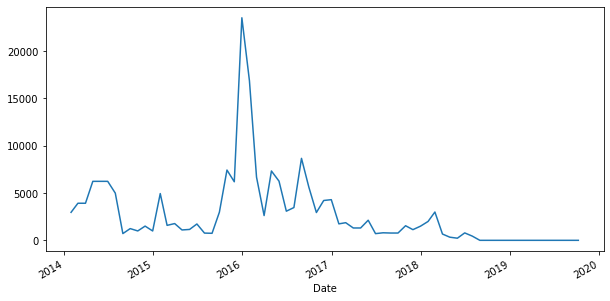

In [ ]:
wealth_index_N02BA = 1000*(1+rets2["N02BA"]).cumprod()
wealth_index_N02BA.plot()

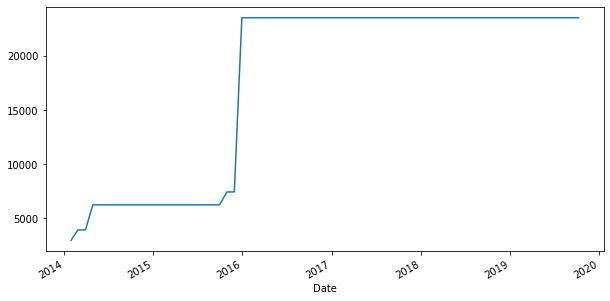

In [ ]:
previous_peaks_N02BA = wealth_index_N02BA.cummax()
previous_peaks_N02BA.plot()

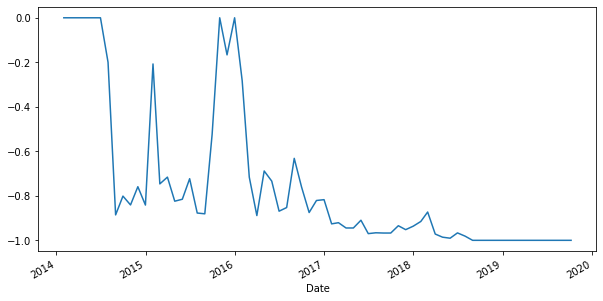

In [ ]:
drawdown_N02BA = (wealth_index_N02BA - previous_peaks_N02BA)/previous_peaks_N02BA
drawdown_N02BA.plot()

In [ ]:
drawdown_N02BA.min()

-1.0

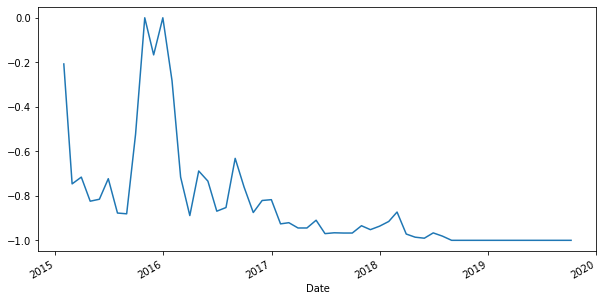

In [ ]:
drawdown_N02BA["2015":].plot()

In [ ]:
drawdown_N02BA["2017":].max()

-0.8728677672559088

#### N02BE

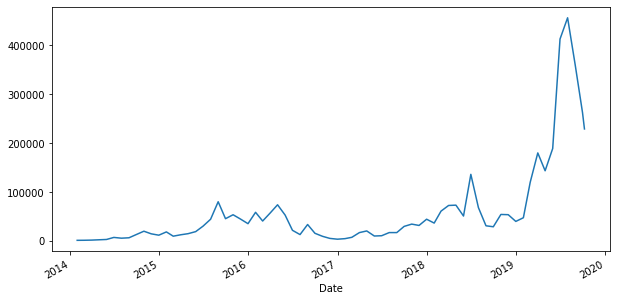

In [ ]:
wealth_index_N02BE = 1000*(1+rets2["N02BE"]).cumprod()
wealth_index_N02BE.plot()

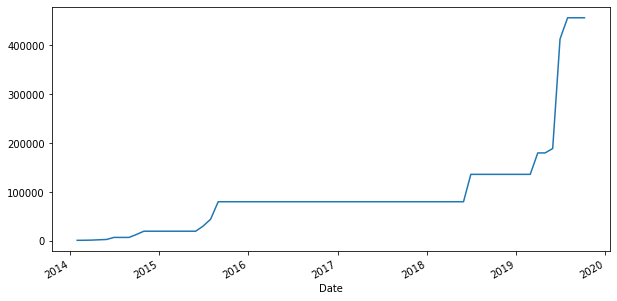

In [ ]:
previous_peaks_N02BE = wealth_index_N02BE.cummax()
previous_peaks_N02BE.plot()

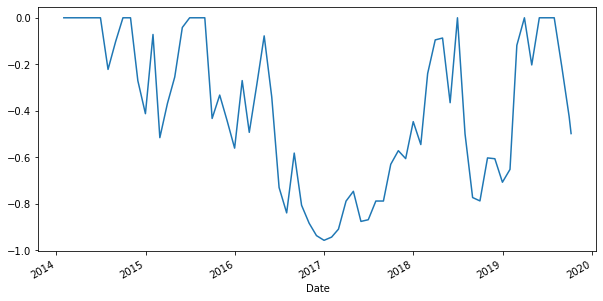

In [ ]:
drawdown_N02BE = (wealth_index_N02BE - previous_peaks_N02BE)/previous_peaks_N02BE
drawdown_N02BE.plot()

In [ ]:
drawdown_N02BE.min()

-0.9578507138611172

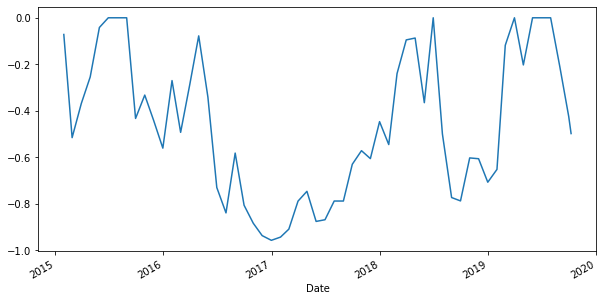

In [ ]:
drawdown_N02BE["2015":].plot()

In [ ]:
drawdown_N02BE["2018":].min()

-0.7881966614977651

#### N05B

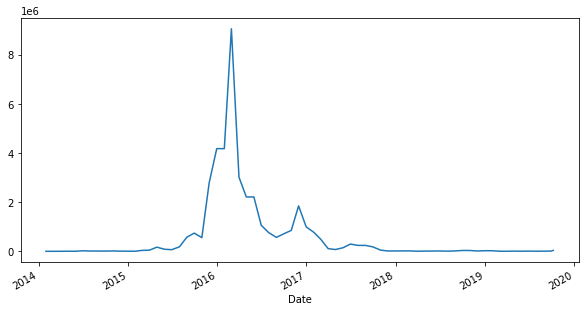

In [ ]:
wealth_index_N05B = 1000*(1+rets2["N05B"]).cumprod()
wealth_index_N05B.plot()

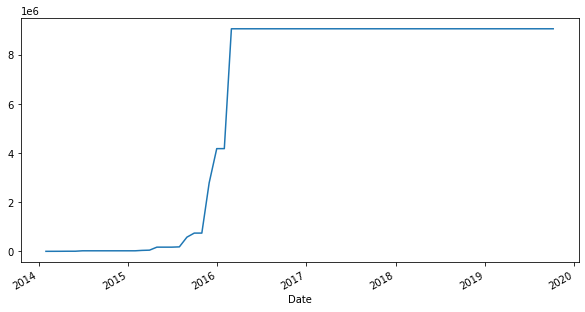

In [ ]:
previous_peaks_N05B = wealth_index_N05B.cummax()
previous_peaks_N05B.plot()

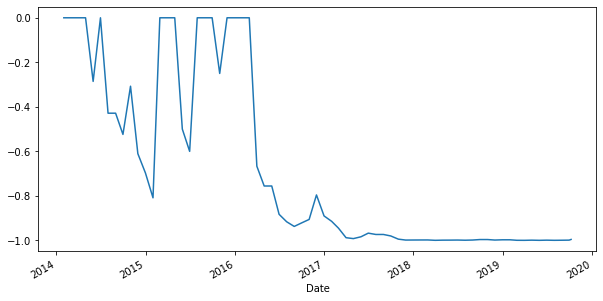

In [ ]:
drawdown_N05B = (wealth_index_N05B - previous_peaks_N05B)/previous_peaks_N05B
drawdown_N05B.plot()

In [ ]:
drawdown_N05B.min()

-0.9995428047070759

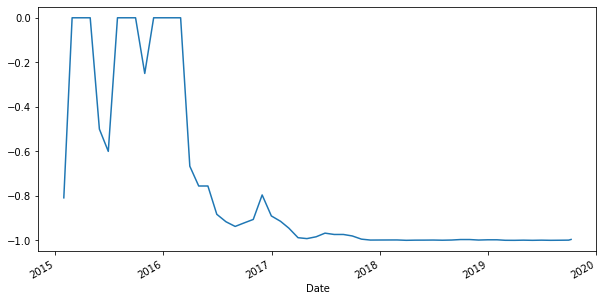

In [ ]:
drawdown_N05B["2015":].plot()

In [ ]:
drawdown_N05B["2017":].max()

-0.9141463414681261

#### R03

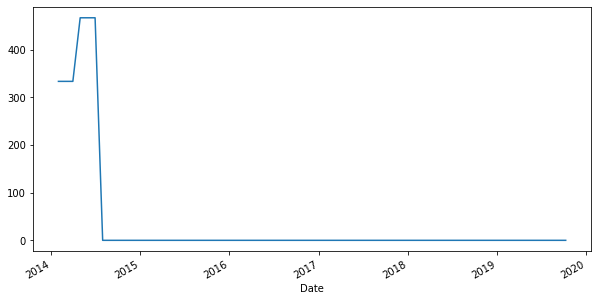

In [ ]:
wealth_index_R03 = 1000*(1+rets2["R03"]).cumprod()
wealth_index_R03.plot()

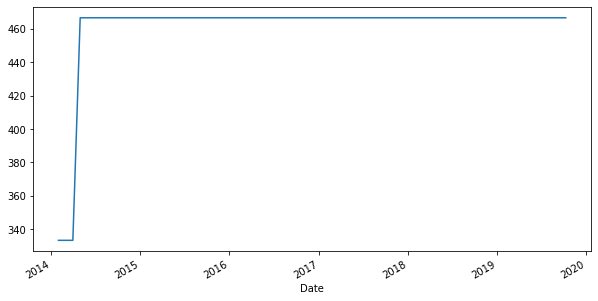

In [ ]:
previous_peaks_R03 = wealth_index_R03.cummax()
previous_peaks_R03.plot()

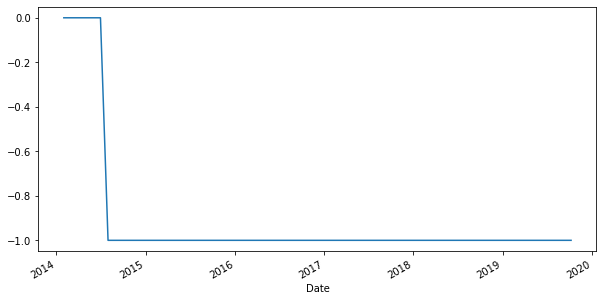

In [ ]:
drawdown_R03 = (wealth_index_R03 - previous_peaks_R03)/previous_peaks_R03
drawdown_R03.plot()

In [ ]:
drawdown_R03.min()

-1.0

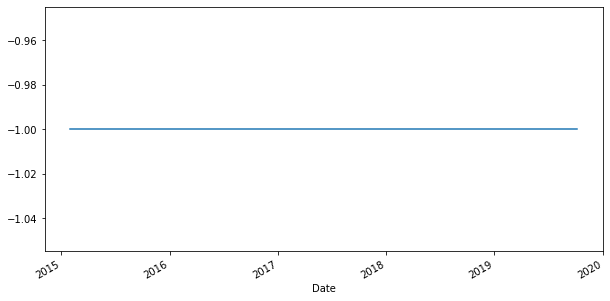

In [ ]:
drawdown_R03["2015":].plot()

In [ ]:
drawdown_R03["2015":].min()

-1.0

#### R06

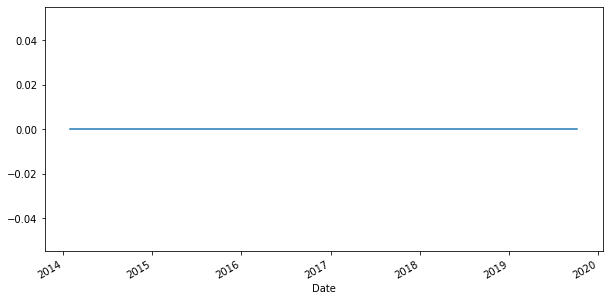

In [ ]:
wealth_index_R06 = 1000*(1+rets2["R06"]).cumprod()
wealth_index_R06.plot()

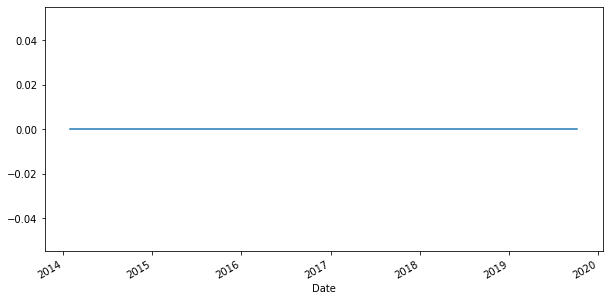

In [ ]:
previous_peaks_R06 = wealth_index_R06.cummax()
previous_peaks_R06.plot()

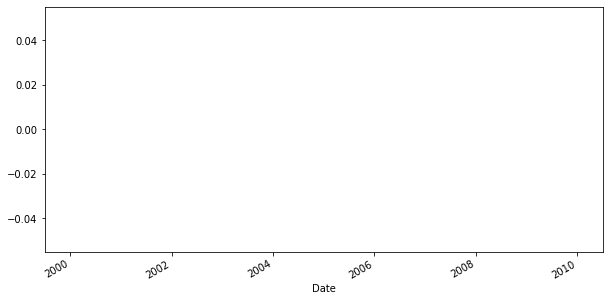

In [ ]:
drawdown_R06 = (wealth_index_R06 - previous_peaks_R06)/previous_peaks_R06
drawdown_R06.plot()

In [ ]:
drawdown_R06.min()

nan

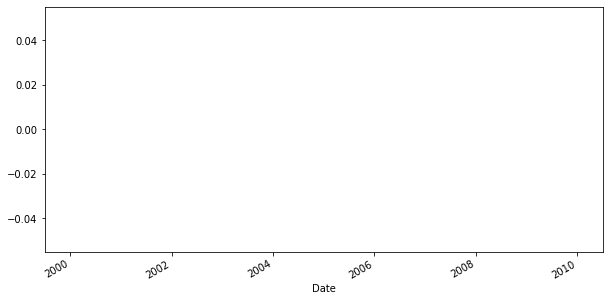

In [ ]:
drawdown_R06["2015":].plot()

In [ ]:
drawdown_R06["2015":].min()

nan

## Time Series Analysis (part 1)

In [ ]:
df_sales_daily = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/salesdaily.csv')

In [ ]:
df_sales_daily.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014,1,248,Thursday
1,1/3/2014,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014,1,276,Friday
2,1/4/2014,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014,1,276,Saturday
3,1/5/2014,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014,1,276,Sunday
4,1/6/2014,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014,1,276,Monday


### Seasonality Analysis


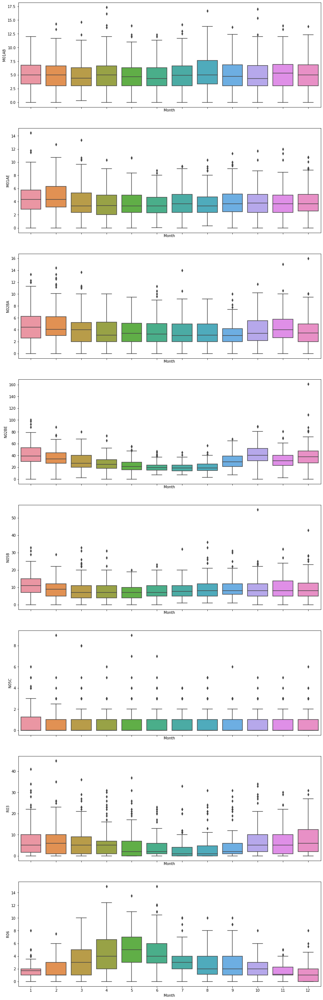

In [ ]:
fig, axes = plt.subplots(8, 1, figsize=(15, 50), sharex=True)
for name, ax in zip(['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06'], axes):
    sns.boxplot(data=df_sales_daily, x='Month', y=name, ax=ax)

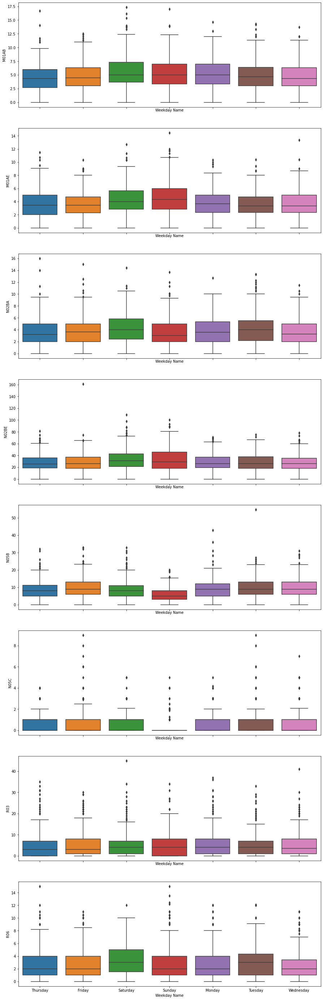

In [ ]:
fig, axes = plt.subplots(8, 1, figsize=(15, 50), sharex=True)
for name, ax in zip(['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06'], axes):
    sns.boxplot(data=df_sales_daily, x='Weekday Name', y=name, ax=ax)

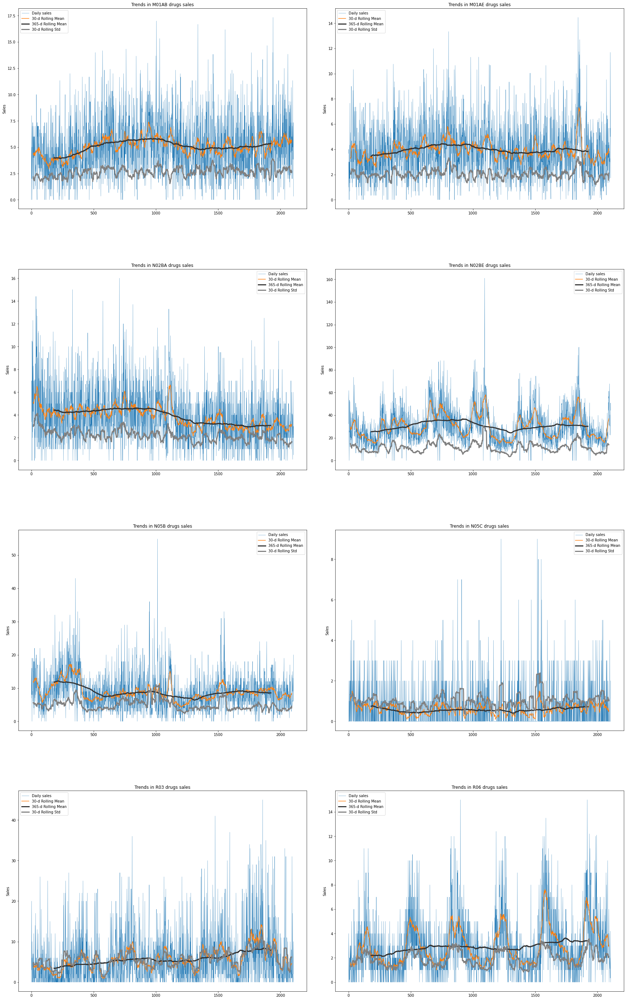

In [ ]:
cols_plot = ['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06']
dfatc_365d = df_sales_daily[cols_plot].rolling(window=365, center=True).mean()
dfatc_30d = df_sales_daily[cols_plot].rolling(30, center=True).mean()
dfatc_std = df_sales_daily[cols_plot].rolling(30, center=True).std()
subplotindex = 0
numrows = 4
numcols = 2
fig, ax = plt.subplots(numrows, numcols, figsize=(30, 50))
plt.subplots_adjust(wspace=0.1, hspace=0.3)

for x in cols_plot:
    rowindex=math.floor(subplotindex/numcols)
    colindex=subplotindex-(rowindex*numcols)
    ax[rowindex,colindex].plot(df_sales_daily.loc[:,x], linewidth=0.5, label='Daily sales')
    ax[rowindex,colindex].plot(dfatc_30d.loc[:,x], label='30-d Rolling Mean')
    ax[rowindex,colindex].plot(dfatc_365d.loc[:,x], color='0.2', linewidth=3, label='365-d Rolling Mean')
    ax[rowindex,colindex].plot(dfatc_std.loc[:,x], color='0.5', linewidth=3, label='30-d Rolling Std')
    ax[rowindex,colindex].set_ylabel('Sales')
    ax[rowindex,colindex].legend()
    ax[rowindex,colindex].set_title('Trends in ' + x + ' drugs sales');   
    subplotindex = subplotindex + 1
plt.show()

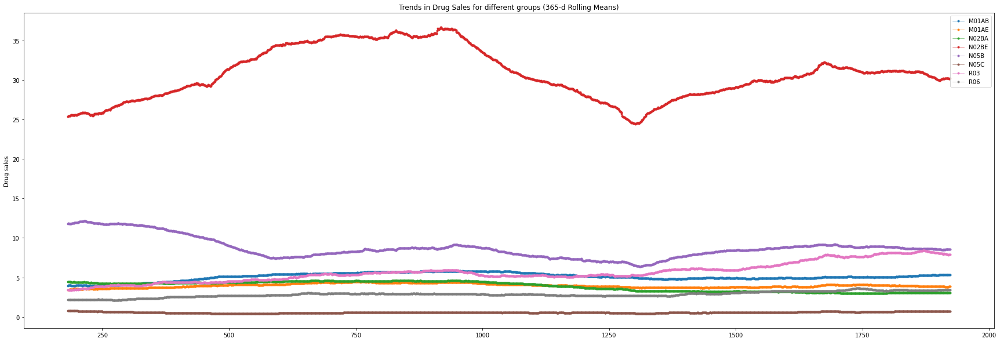

In [ ]:
fig, ax = plt.subplots(figsize=(30, 10))
for nm in cols_plot:
    ax.plot(dfatc_365d[nm], label=nm, marker='.', linestyle='-', linewidth=0.5)
    ax.legend()
    ax.set_ylabel('Drug sales')
    ax.set_title('Trends in Drug Sales for different groups (365-d Rolling Means)');

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


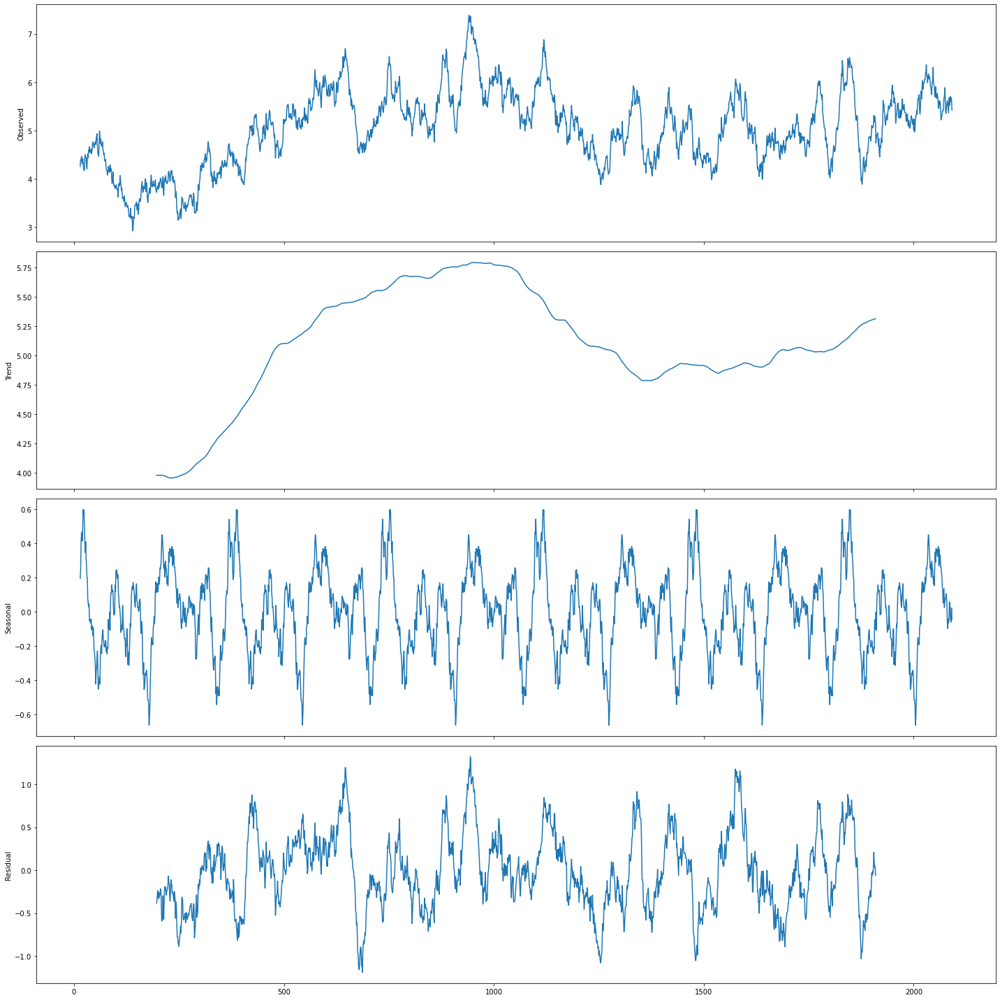

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(df_sales_daily['M01AB'].rolling(30, center=True).mean().dropna(), freq=365, filt=None)
plt.rcParams["figure.figsize"] = (20,20)
result.plot()
plt.show()

In [ ]:
for x in ['M01AB','M01AE','N02BA','N02BE','N05B','N05C','R03','R06']:
    result = seasonal_decompose(df_sales_weekly[x], freq=52, model = 'additive')
    dfs = pd.concat([result.trend, result.seasonal, result.resid, result.observed], axis=1)
    dfs.columns = ['trend', 'seasonal', 'residuals', 'observed']
    dfs = dfs.dropna()
    res = dfs['residuals'].values
    obs = dfs['observed'].values
    resmean = np.mean(np.abs(res))
    obsmean = np.mean(np.abs(obs))
    perc = resmean*100/obsmean
    print(x + ' RESMEAN:' + str(resmean) + ', OBSMEAN:' + str(obsmean) + ', PERC:' + str(perc) + '%')

M01AB RESMEAN:5.26715996284115, OBSMEAN:35.59490833332001, PERC:14.797509558159527%
M01AE RESMEAN:4.319542609675869, OBSMEAN:28.00801458336, PERC:15.422523423856601%
N02BA RESMEAN:3.9228389592521657, OBSMEAN:27.083016, PERC:14.484498178682042%
N02BE RESMEAN:29.534357236963668, OBSMEAN:217.6597028336, PERC:13.569051529737028%
N05B RESMEAN:12.94840305932125, OBSMEAN:61.96614999972, PERC:20.895929566997072%
N05C RESMEAN:2.0384606385595405, OBSMEAN:3.871833333332, PERC:52.648460382081936%
R03 RESMEAN:11.722244335544508, OBSMEAN:40.06845833336, PERC:29.25554119906046%
R06 RESMEAN:4.278758416393868, OBSMEAN:19.744589999960002, PERC:21.67053565762842%


### Stationarity Analysis

In [ ]:
from statsmodels.tsa.stattools import adfuller

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
for x in ['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06']:
    dftest = adfuller(df_sales_weekly[x], regression='ct', autolag='AIC')
    print("ADF test for "+x)
    print("-----------------------------")
    print("Test statistic = {:.3f}".format(dftest[0]))
    print("P-value = {:.3f}".format(dftest[1]))
    print("Critical values :")
    for k, v in dftest[4].items():
        print("\t{}: {} - The data is {} stationary with {}% confidence".format(k, v, "not" if v<dftest[0] else "", 100-int(k[:-1])))

ADF test for M01AB
-----------------------------
Test statistic = -3.700
P-value = 0.022
Critical values :
	1%: -3.9897903649837616 - The data is not stationary with 99% confidence
	5%: -3.425478311521626 - The data is  stationary with 95% confidence
	10%: -3.1358607194990724 - The data is  stationary with 90% confidence
ADF test for M01AE
-----------------------------
Test statistic = -8.717
P-value = 0.000
Critical values :
	1%: -3.98926783537037 - The data is  stationary with 99% confidence
	5%: -3.425226747185185 - The data is  stationary with 95% confidence
	10%: -3.1357131066666666 - The data is  stationary with 90% confidence
ADF test for N02BA
-----------------------------
Test statistic = -2.670
P-value = 0.249
Critical values :
	1%: -3.990441532957606 - The data is not stationary with 99% confidence
	5%: -3.425791763669738 - The data is not stationary with 95% confidence
	10%: -3.1360446341572343 - The data is not stationary with 90% confidence
ADF test for N02BE
------------

In [ ]:
from statsmodels.tsa.stattools import kpss
#warnings.filterwarnings("ignore")

In [ ]:
for x in ['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06']:
    print(" > Is " + x + " data stationary ?")
    dftest = kpss(np.log(df_sales_weekly[x]), 'ct')
    print("Test statistic = {:.3f}".format(dftest[1]))
    print("Critical values: ")
    for k, v in dftest[3].items():
        print("\t{}: {}".format(k, v))

 > Is M01AB data stationary ?
Test statistic = 0.010
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is M01AE data stationary ?
Test statistic = 0.010
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is N02BA data stationary ?
Test statistic = 0.049
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is N02BE data stationary ?
Test statistic = 0.100
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is N05B data stationary ?
Test statistic = 0.056
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is N05C data stationary ?
Test statistic = nan
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is R03 data stationary ?
Test statistic = 0.100
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216
 > Is R06 data stationary ?
Test statistic = 0.100
Critical values: 
	10%: 0.119
	5%: 0.146
	2.5%: 0.176
	1%: 0.216


/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1685: FutureWarning: The behavior of using lags=None will change in the next release. Currently lags=None is the same as lags='legacy', and so a sample-size lag length is used. After the next release, the default will change to be the same as lags='auto' which uses an automatic lag length selection method. To silence this warning, either use 'auto' or 'legacy'
  warn(msg, FutureWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1709: InterpolationWarning: p-value is smaller than the indicated p-value
  warn("p-value is smaller than the indicated p-value", InterpolationWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:1711: InterpolationWarning: p-valu

### Regularity Analysis

In [ ]:
def ApEn(U, m, r):
    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])
    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0) for x_i in x]
        return (N - m + 1.0)**(-1) * sum(np.log(C))
    N = len(U)
    return abs(_phi(m+1) - _phi(m))

In [ ]:
for x in ['M01AB','M01AE','N02BA','N02BE', 'N05B','N05C','R03','R06']:
    print(x + ': ' + str(ApEn(df_sales_weekly[x].values, m=2, r=0.2*np.std(df_sales_weekly[x].values))))

M01AB: 1.141130089570642
M01AE: 1.166363924596575
N02BA: 1.1370638730125302
N02BE: 1.058024809082593
N05B: 1.074437415034502
N05C: 1.0361887401424648
R03: 1.1847216239035152
R06: 1.031759595747876


### Autocorrelation analysis

## Sales Prediction with Machine Learning

### Predict the pharma sales in January 2020


In [ ]:
def scatterData(X_train, y_train, X_test, y_test, title):
    plt.title('Prediction using ' + title)
    plt.xlabel('Month sequence', fontsize=20)
    plt.ylabel('Sales', fontsize=20)

    # Use Matplotlib Scatter Plot
    plt.scatter(X_train, y_train, color='blue', label='Training observation points')
    plt.scatter(X_test, y_test, color='cyan', label='Testing observation points')

### Linear Regression

In [ ]:
def predictLinearRegression(X_train, y_train, X_test, y_test):

    y_train = y_train.reshape(-1, 1)
    y_test = y_test.reshape(-1, 1)

    scatterData(X_train, y_train, X_test, y_test, 'Linear Regression')

    reg = linear_model.LinearRegression()
    reg.fit(X_train, y_train)
    plt.plot(X_train, reg.predict(X_train), color='red', label='Linear regressor')
    plt.legend()
    plt.show()

    # LINEAR REGRESSION - Predict/Test model
    y_predict_linear = reg.predict(X_test)

    # LINEAR REGRESSION - Predict for January 2020
    linear_predict = reg.predict([[predictFor]])
    # linear_predict = reg.predict([[predictFor]])[0]

    # LINEAR REGRESSION - Accuracy
    accuracy = reg.score(X_train, y_train)

    # LINEAR REGRESSION - Error
    # error = round(np.mean((y_predict_linear-y_test)**2), 2)
    
    # Results
    print('Linear Regression: ' + str(linear_predict) + ' (Accuracy: ' + str(round(accuracy*100)) + '%)')

    return {'regressor':reg, 'values':linear_predict}

### Polynomial Regression

In [ ]:
def predictPolynomialRegression(X_train, y_train, X_test, y_test):

    y_train = y_train.reshape(-1, 1)
    y_test = y_test.reshape(-1, 1)

    scatterData(X_train, y_train, X_test, y_test, 'Polynomial Regression')
    
    poly_reg = PolynomialFeatures(degree = 2)
    X_poly = poly_reg.fit_transform(X_train)
    poly_reg_model = linear_model.LinearRegression()
    poly_reg_model.fit(X_poly, y_train)
    plt.plot(X_train, poly_reg_model.predict(poly_reg.fit_transform(X_train)), color='green', label='Polynomial regressor')
    plt.legend()
    plt.show()

    # Polynomial Regression - Predict/Test model
    y_predict_polynomial = poly_reg_model.predict(X_poly)

    # Polynomial Regression - Predict for January 2020
    polynomial_predict = poly_reg_model.predict(poly_reg.fit_transform([[predictFor]]))

    # Polynomial Regression - Accuracy
    # X_poly_test = poly_reg.fit_transform(X_test)
    accuracy = poly_reg_model.score(X_poly, y_train)

    # Polynomial Regression - Error
    # error = round(np.mean((y_predict_polynomial-y_train)**2), 2)

    # Result
    print('Polynomial Regression: ' + str(polynomial_predict) + ' (Accuracy: ' + str(round(accuracy*100)) + '%)')
    return {'regressor':poly_reg_model, 'values':polynomial_predict}

### Simple Vector Regression (SVR)

In [ ]:
def predictSVR(X_train, y_train, X_test, y_test):

    y_train = y_train.reshape(-1, 1)
    y_test = y_test.reshape(-1, 1)

    scatterData(X_train, y_train, X_test, y_test, 'Simple Vector Regression (SVR)')

    svr_regressor = SVR(kernel='rbf', gamma='auto')
    svr_regressor.fit(X_train, y_train.ravel())

    # plt.scatter(X_train, y_train, color='red', label='Actual observation points')
    plt.plot(X_train, svr_regressor.predict(X_train), label='SVR regressor')
    plt.legend()
    plt.show()

    # Simple Vector Regression (SVR) - Predict/Test model
    y_predict_svr = svr_regressor.predict(X_test)

    # Simple Vector Regression (SVR) - Predict for January 2020
    svr_predict = svr_regressor.predict([[predictFor]])

    # Simple Vector Regression (SVR) - Accuracy
    accuracy = svr_regressor.score(X_train, y_train)

    # Simple Vector Regression (SVR) - Error
    # error = round(np.mean((y_predict_svr-y_train)**2), 2)
    
    # Result
    print('Simple Vector Regression (SVR): ' + str(svr_predict) + ' (Accuracy: ' + str(round(accuracy*100)) + '%)')
    return {'regressor':svr_regressor, 'values':svr_predict}

### Define a pharma product

In [ ]:
product_N02BA = 'N02BA'

In [ ]:
regResults_N02BA = pd.DataFrame(columns=('Linear', 'Polynomial', 'SVR', 'Voting Regressor'), index=[product_N02BA])

In [ ]:
rcParams['figure.figsize'] = 12, 8

In [ ]:
df_sales_monthly = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Projects/Pharma Sales/salesmonthly.csv')

In [ ]:
df_sales_monthly = df_sales_monthly.loc[df_sales_monthly['datum'].str.contains("2014") | df_sales_monthly['datum'].str.contains("2015") | df_sales_monthly['datum'].str.contains("2016") | df_sales_monthly['datum'].str.contains("2017") | df_sales_monthly['datum'].str.contains("2018") | df_sales_monthly['datum'].str.contains("2019")]
df_sales_monthly = df_sales_monthly.reset_index()

In [ ]:
df_sales_monthly

,index,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,0,2014-01-31,127.69,99.090,152.100,878.030,354.0,50.0,112.0,48.20
1,1,2014-02-28,133.32,126.050,177.000,1001.900,347.0,31.0,122.0,36.20
2,2,2014-03-31,137.44,92.950,147.655,779.275,232.0,20.0,112.0,85.40
3,3,2014-04-30,113.10,89.475,130.900,698.500,209.0,18.0,97.0,73.70
4,4,2014-05-31,101.79,119.933,132.100,628.780,270.0,23.0,107.0,123.70
...,...,...,...,...,...,...,...,...,...,...
65,65,2019-06-30,151.54,101.627,103.200,610.000,193.0,25.0,142.0,156.04
66,66,2019-07-31,181.00,103.541,92.800,649.800,250.6,20.0,115.0,105.20
67,67,2019-08-31,181.91,88.269,84.200,518.100,237.0,26.0,145.0,97.30
68,68,2019-09-30,161.07,111.437,93.500,984.480,227.8,16.0,161.0,109.10


In [ ]:
df_sales_monthly['datumNumber'] = 1
for index, row in df_sales_monthly.iterrows():
    df_sales_monthly.loc[index, 'datumNumber'] = index+1

In [ ]:
# the first and the last available month is quite low which may indicate that it might be incomplete
# and skewing results so we're dropping it
df_sales_monthly.drop(df_sales_monthly.head(1).index,inplace=True)
df_sales_monthly.drop(df_sales_monthly.tail(1).index,inplace=True)

In [ ]:
df_sales_monthly = df_sales_monthly[df_sales_monthly[product_N02BA] != 0]

In [ ]:
df_sales_monthly.head()

,index,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,datumNumber
1,1,2014-02-28,133.32,126.050,177.000,1001.900,347.0,31.0,122.0,36.2,2
2,2,2014-03-31,137.44,92.950,147.655,779.275,232.0,20.0,112.0,85.4,3
3,3,2014-04-30,113.10,89.475,130.900,698.500,209.0,18.0,97.0,73.7,4
4,4,2014-05-31,101.79,119.933,132.100,628.780,270.0,23.0,107.0,123.7,5
5,5,2014-06-30,112.07,94.710,122.900,548.225,323.0,23.0,57.0,109.3,6


In [ ]:
predictFor = len(df_sales_monthly) + 5

In [ ]:
print('Predictions for the product ' + str(product_N02BA) + ' sales in January 2020')

Predictions for the product N02BA sales in January 2020


In [ ]:
regValues_N02BA = {}

In [ ]:
dfSplit_N02BA = df_sales_monthly[['datumNumber', product_N02BA]]

# We are going to keep 30% of the dataset in test dataset
train, test = train_test_split(dfSplit_N02BA, test_size=3/10, random_state=0)

trainSorted = train.sort_values('datumNumber', ascending=True)
testSorted = test.sort_values('datumNumber', ascending=True)

X_train = trainSorted[['datumNumber']].values
y_train = trainSorted[product_N02BA].values
X_test = testSorted[['datumNumber']].values
y_test = testSorted[product_N02BA].values

### Feature Scaling

To improve the performance of the model

In [ ]:
# scale_X = StandardScaler()
# scale_y = StandardScaler()

# X_train = scale_X.fit_transform(X_train)
# y_train = scale_y.fit_transform(y_train.reshape(-1, 1))

# X_test = scale_X.fit_transform(X_test)
# y_test = scale_y.fit_transform(y_test.reshape(-1, 1))

### Performance

### Linear Regression

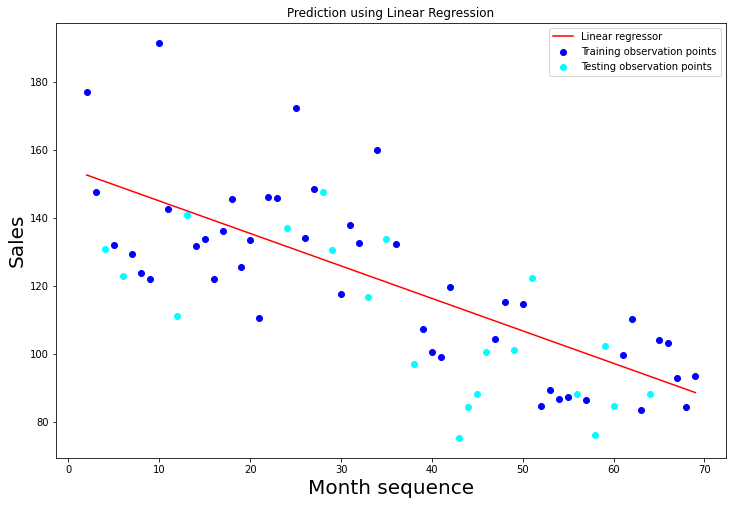

Linear Regression: [[85.72]] (Accuracy: 58%)


In [ ]:
linearResult_N02BA = predictLinearRegression(X_train, y_train, X_test, y_test)
reg_N02BA = linearResult_N02BA['regressor']
regValues_N02BA['Linear'] = round(linearResult_N02BA['values'][0][0])

#### Polynomial Regression

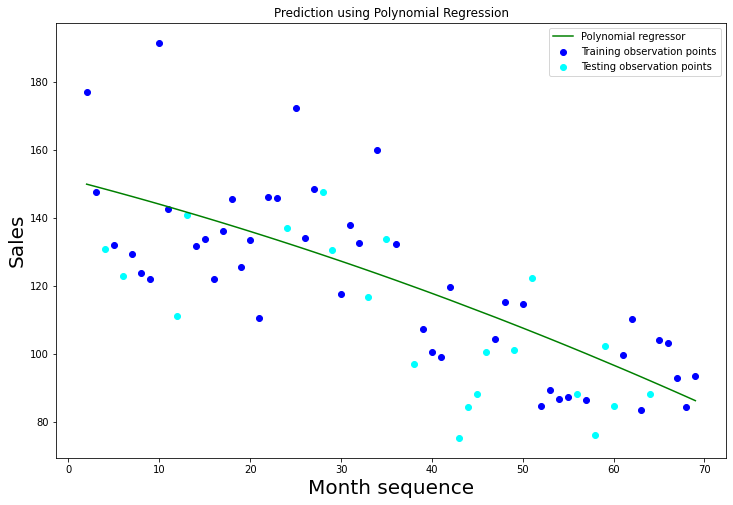

Polynomial Regression: [[82.59]] (Accuracy: 58%)


In [ ]:
polynomialResult_N02BA = predictPolynomialRegression(X_train, y_train, X_test, y_test)
polynomial_regressor_N02BA = polynomialResult_N02BA['regressor']
regValues_N02BA['Polynomial'] = round(polynomialResult_N02BA['values'][0][0])

#### Simple Vector Regression (SVR)

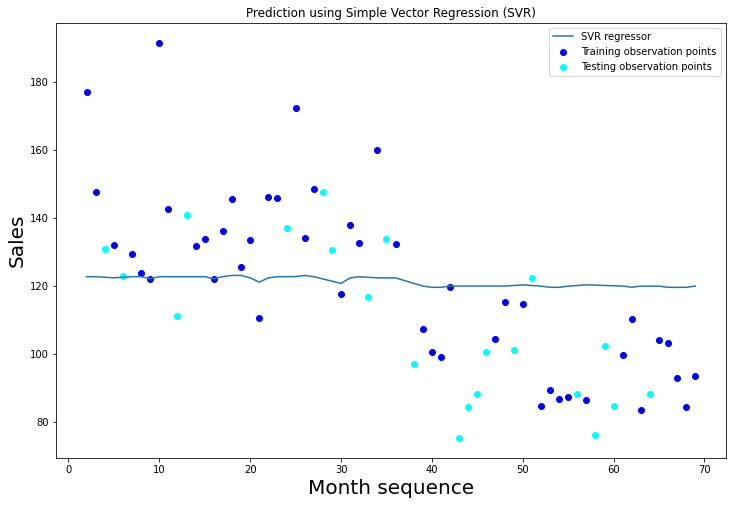

Simple Vector Regression (SVR): [121.33] (Accuracy: 9%)


In [ ]:
svrResult_N02BA = predictSVR(X_train, y_train, X_test, y_test)
svr_regressor_N02BA = svrResult_N02BA['regressor']
regValues_N02BA['SVR'] = round(svrResult_N02BA['values'][0])

#### Voting Regressor

In [ ]:
vRegressor_N02BA = VotingRegressor(estimators=[('reg', reg_N02BA), ('polynomial_regressor', polynomial_regressor_N02BA), ('svr_regressor', svr_regressor_N02BA)])

vRegressorRes = vRegressor_N02BA.fit(X_train, y_train.ravel())

# VotingRegressor - Predict for January 2020
vRegressor_predict_N02BA = vRegressor_N02BA.predict([[predictFor]])
regValues_N02BA['Voting Regressor'] = round(vRegressor_predict_N02BA[0])
print('Voting Regressor January 2020 predicted value: ' + str(round(vRegressor_predict_N02BA[0])))
regResults_N02BA.loc[product_N02BA] = regValues_N02BA

Voting Regressor January 2020 predicted value: 98


In [ ]:
regResults_N02BA

,Linear,Polynomial,SVR,Voting Regressor
N02BA,86,83,121,98


## Association Rules (Market Basket Analysis)

In [ ]:
df_sales_daily_products = df_sales_daily.copy()
df_sales_daily_products.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0,2014,1,248,Thursday
1,1/3/2014,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0,2014,1,276,Friday
2,1/4/2014,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0,2014,1,276,Saturday
3,1/5/2014,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0,2014,1,276,Sunday
4,1/6/2014,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0,2014,1,276,Monday


In [ ]:
df_sales_daily_products = df_sales_daily_products[['datum',	'M01AB',	'M01AE',	'N02BA', 'N02BE', 'N05B',	'N05C',	'R03',	'R06']]
df_sales_daily_products.head()

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,1/2/2014,0.0,3.67,3.4,32.40,7.0,0.0,0.0,2.0
1,1/3/2014,8.0,4.00,4.4,50.60,16.0,0.0,20.0,4.0
2,1/4/2014,2.0,1.00,6.5,61.85,10.0,0.0,9.0,1.0
3,1/5/2014,4.0,3.00,7.0,41.10,8.0,0.0,3.0,0.0
4,1/6/2014,5.0,1.00,4.5,21.70,16.0,2.0,6.0,2.0


In [ ]:
df_sales_daily_products.set_index('datum', inplace=True)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00
1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00
1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00
1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00
1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00
10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33
10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20


In [ ]:
df_sales_daily_products['M01AB'] = (df_sales_daily_products['M01AB'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,3.670,3.40,32.40,7.0,0.0,0.0,2.00
1/3/2014,1,4.000,4.40,50.60,16.0,0.0,20.0,4.00
1/4/2014,1,1.000,6.50,61.85,10.0,0.0,9.0,1.00
1/5/2014,1,3.000,7.00,41.10,8.0,0.0,3.0,0.00
1/6/2014,1,1.000,4.50,21.70,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,5.683,2.25,22.45,13.0,0.0,1.0,1.00
10/5/2019,1,5.010,6.00,25.40,7.0,0.0,0.0,0.33
10/6/2019,1,11.690,2.00,34.60,6.0,0.0,5.0,4.20


In [ ]:
df_sales_daily_products['M01AE'] = (df_sales_daily_products['M01AE'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,3.40,32.40,7.0,0.0,0.0,2.00
1/3/2014,1,1,4.40,50.60,16.0,0.0,20.0,4.00
1/4/2014,1,1,6.50,61.85,10.0,0.0,9.0,1.00
1/5/2014,1,1,7.00,41.10,8.0,0.0,3.0,0.00
1/6/2014,1,1,4.50,21.70,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,2.25,22.45,13.0,0.0,1.0,1.00
10/5/2019,1,1,6.00,25.40,7.0,0.0,0.0,0.33
10/6/2019,1,1,2.00,34.60,6.0,0.0,5.0,4.20


In [ ]:
df_sales_daily_products['N02BA'] = (df_sales_daily_products['N02BA'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,1,32.40,7.0,0.0,0.0,2.00
1/3/2014,1,1,1,50.60,16.0,0.0,20.0,4.00
1/4/2014,1,1,1,61.85,10.0,0.0,9.0,1.00
1/5/2014,1,1,1,41.10,8.0,0.0,3.0,0.00
1/6/2014,1,1,1,21.70,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,1,22.45,13.0,0.0,1.0,1.00
10/5/2019,1,1,1,25.40,7.0,0.0,0.0,0.33
10/6/2019,1,1,1,34.60,6.0,0.0,5.0,4.20


In [ ]:
df_sales_daily_products['N02BE'] = (df_sales_daily_products['N02BE'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,1,1,7.0,0.0,0.0,2.00
1/3/2014,1,1,1,1,16.0,0.0,20.0,4.00
1/4/2014,1,1,1,1,10.0,0.0,9.0,1.00
1/5/2014,1,1,1,1,8.0,0.0,3.0,0.00
1/6/2014,1,1,1,1,16.0,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,1,1,13.0,0.0,1.0,1.00
10/5/2019,1,1,1,1,7.0,0.0,0.0,0.33
10/6/2019,1,1,1,1,6.0,0.0,5.0,4.20


In [ ]:
df_sales_daily_products['N05B'] = (df_sales_daily_products['N05B'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,1,1,1,0.0,0.0,2.00
1/3/2014,1,1,1,1,1,0.0,20.0,4.00
1/4/2014,1,1,1,1,1,0.0,9.0,1.00
1/5/2014,1,1,1,1,1,0.0,3.0,0.00
1/6/2014,1,1,1,1,1,2.0,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,1,1,1,0.0,1.0,1.00
10/5/2019,1,1,1,1,1,0.0,0.0,0.33
10/6/2019,1,1,1,1,1,0.0,5.0,4.20


In [ ]:
df_sales_daily_products['N05C'] = (df_sales_daily_products['N05C'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,1,1,1,0,0.0,2.00
1/3/2014,1,1,1,1,1,0,20.0,4.00
1/4/2014,1,1,1,1,1,0,9.0,1.00
1/5/2014,1,1,1,1,1,0,3.0,0.00
1/6/2014,1,1,1,1,1,1,6.0,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,1,1,1,0,1.0,1.00
10/5/2019,1,1,1,1,1,0,0.0,0.33
10/6/2019,1,1,1,1,1,0,5.0,4.20


In [ ]:
df_sales_daily_products['R03'] = (df_sales_daily_products['R03'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,1,1,1,0,0,2.00
1/3/2014,1,1,1,1,1,0,1,4.00
1/4/2014,1,1,1,1,1,0,1,1.00
1/5/2014,1,1,1,1,1,0,1,0.00
1/6/2014,1,1,1,1,1,1,1,2.00
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,1,1,1,0,1,1.00
10/5/2019,1,1,1,1,1,0,0,0.33
10/6/2019,1,1,1,1,1,0,1,4.20


In [ ]:
df_sales_daily_products['R06'] = (df_sales_daily_products['R06'] > 0).astype(int)
df_sales_daily_products

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
datum,,,,,,,,
1/2/2014,0,1,1,1,1,0,0,1
1/3/2014,1,1,1,1,1,0,1,1
1/4/2014,1,1,1,1,1,0,1,1
1/5/2014,1,1,1,1,1,0,1,0
1/6/2014,1,1,1,1,1,1,1,1
...,...,...,...,...,...,...,...,...
10/4/2019,1,1,1,1,1,0,1,1
10/5/2019,1,1,1,1,1,0,0,1
10/6/2019,1,1,1,1,1,0,1,1


In [ ]:
itemsets = apriori(df_sales_daily_products, min_support=0.2, use_colnames=True)
itemsets

,support,itemsets
0,0.981007,(M01AB)
1,0.982906,(M01AE)
2,0.962963,(N02BA)
3,0.987654,(N02BE)
4,0.979582,(N05B)
...,...,...
250,0.208927,"(M01AE, R03, R06, M01AB, N02BA, N05B, N05C)"
251,0.214625,"(M01AE, R03, R06, M01AB, N05B, N05C, N02BE)"
252,0.210826,"(R03, R06, M01AB, N02BA, N05B, N05C, N02BE)"
253,0.209877,"(M01AE, R03, R06, N02BA, N05B, N05C, N02BE)"


In [ ]:
rules = association_rules(itemsets, metric='confidence', min_threshold=0.5)
rules.sort_values(by=['lift'], ascending=False).head(6)
print(rules.sort_values(by=['lift'], ascending=False).drop(columns=['antecedent support', 'consequent support', 'conviction']).head(6))

                     antecedents                 consequents   support  \
3514          (N05B, N02BA, R06)  (N02BE, R03, M01AB, M01AE)  0.661918   
3457  (N02BE, R03, M01AB, M01AE)          (N05B, N02BA, R06)  0.661918   
2575         (M01AB, M01AE, R03)          (N05B, N02BA, R06)  0.661918   
3487         (R03, M01AB, M01AE)   (N05B, N02BA, R06, N02BE)  0.661918   
2592          (N05B, N02BA, R06)         (M01AB, M01AE, R03)  0.661918   
3484   (N05B, N02BA, R06, N02BE)         (R03, M01AB, M01AE)  0.661918   

      confidence      lift  leverage  
3514    0.779206  1.023073  0.014928  
3457    0.869077  1.023073  0.014928  
2575    0.869077  1.023073  0.014928  
3487    0.869077  1.023073  0.014928  
2592    0.779206  1.023073  0.014928  
3484    0.779206  1.023073  0.014928  


In [ ]:
rules[[len(c) == 1 for c in rules.consequents]].sort_values(by=['lift'], ascending=False).head(6)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
595,"(M01AB, N02BA, R06)",(R03),0.852327,0.77018,0.670465,0.786630,1.021357,0.014020,1.077092
1616,"(M01AB, N02BA, R06, N02BE)",(R03),0.852327,0.77018,0.670465,0.786630,1.021357,0.014020,1.077092
1676,"(N05B, M01AB, N02BA, R06)",(R03),0.845204,0.77018,0.664767,0.786517,1.021211,0.013808,1.076523
2899,"(R06, M01AB, N02BA, N05B, N02BE)",(R03),0.845204,0.77018,0.664767,0.786517,1.021211,0.013808,1.076523
3428,"(M01AE, R06, M01AB, N02BA, N05B, N02BE)",(R03),0.841880,0.77018,0.661918,0.786238,1.020849,0.013519,1.075119
2558,"(M01AE, R06, M01AB, N02BA, N05B)",(R03),0.841880,0.77018,0.661918,0.786238,1.020849,0.013519,1.075119


If `M01AB, N02BA, R06` is purchased, then with confidence **78.66%** `R03` will also be purchased. This rule has a lift ratio of
**1.0214**.

If `M01AB, N02BA, R06, N02BE` is purchased, then with confidence **78.66%** `R03` will also be purchased. This rule has a lift ratio of
**1.0214**.

If `N05B, M01AB, N02BA, R06` is purchased, then with confidence **78.65%** `R03` will also be purchased. This rule has a lift ratio of
**1.0212**.

If `R06, M01AB, N02BA, N05B, N02BE` is purchased, then with confidence **78.65%** `R03` will also be purchased. This rule has a lift ratio of
**1.0212**.

If `M01AE, R06, M01AB, N02BA, N05B, N02BE` is purchased, then with confidence **78.62%** `R03` will also be purchased. This rule has a lift ratio of **1.0208**.

If `M01AE, R06, M01AB, N02BA, N05B` is purchased, then with confidence **78.62%** `R03` will also be purchased. This rule has a lift ratio of
**1.0208**.

The support for the rule indicates its impact in terms of overall size: How many transactions are affected? If
only a small number of transactions are affected, the rule may be of little use (unless the consequent is very
valuable and/or the rule is very efficient in finding it).

• The lift ratio indicates how efficient the rule is in finding consequents, compared to random selection. A very
efficient rule is preferred to an inefficient rule, but we must still consider support: A very efficient rule that
has very low support may not be as desirable as a less efficient rule with much greater support.

• The confidence tells us at what rate consequents will be found and is useful in determining the business or
operational usefulness of a rule: A rule with low confidence may find consequents at too low a rate to be
worth the cost of (say) promoting the consequent in all the transactions that involve the antecedent.

## Time Series Forecasting (part 2)

#### M01AB

In [ ]:
df_sales_daily_M01AB_datum = df_sales_daily[['datum', 'M01AB']]
df_sales_daily_M01AB_datum.head(10)

,datum,M01AB
0,1/2/2014,0.00
1,1/3/2014,8.00
2,1/4/2014,2.00
3,1/5/2014,4.00
4,1/6/2014,5.00
5,1/7/2014,0.00
6,1/8/2014,5.33
7,1/9/2014,7.00
8,1/10/2014,5.00
9,1/11/2014,5.00


In [ ]:
df_sales_daily_M01AB_datum['Date'] = pd.to_datetime(df_sales_daily_M01AB_datum.datum, format='%m/%d/%Y')
df_sales_daily_M01AB_datum.head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,datum,M01AB,Date
0,1/2/2014,0.00,2014-01-02
1,1/3/2014,8.00,2014-01-03
2,1/4/2014,2.00,2014-01-04
3,1/5/2014,4.00,2014-01-05
4,1/6/2014,5.00,2014-01-06
5,1/7/2014,0.00,2014-01-07
6,1/8/2014,5.33,2014-01-08
7,1/9/2014,7.00,2014-01-09
8,1/10/2014,5.00,2014-01-10
9,1/11/2014,5.00,2014-01-11


In [ ]:
M01AB_ts = pd.Series(df_sales_daily_M01AB_datum.M01AB.values, index=df_sales_daily_M01AB_datum.Date, name='M01AB_Sales')

Text(0, 0.5, 'M01AB')

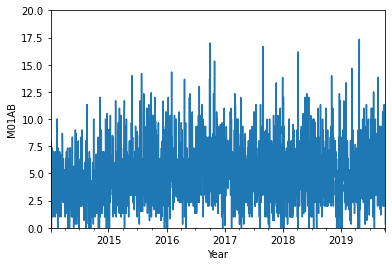

In [ ]:
# Pandas Version
M01AB_ts.plot(ylim=[0, 20], legend=False)
plt.xlabel('Year'); plt.ylabel('M01AB')

In [ ]:
# Create short time series from 2018 to 2018 using a slice 
M01AB_ts_1yr = M01AB_ts['2018':'2018']

In [ ]:
# create a data frame with additional predictors from time series
# the following command adds a constant term, a trend term and a quadratic trend term
M01AB_df = tsatools.add_trend(M01AB_ts, trend='ctt')

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
M01AB_df.head(10)

,M01AB_Sales,const,trend,trend_squared
Date,,,,
2014-01-02,0.00,1.0,1.0,1.0
2014-01-03,8.00,1.0,2.0,4.0
2014-01-04,2.00,1.0,3.0,9.0
2014-01-05,4.00,1.0,4.0,16.0
2014-01-06,5.00,1.0,5.0,25.0
2014-01-07,0.00,1.0,6.0,36.0
2014-01-08,5.33,1.0,7.0,49.0
2014-01-09,7.00,1.0,8.0,64.0
2014-01-10,5.00,1.0,9.0,81.0


In [ ]:
# fit a linear trend model to the time series
M01AB_lm = sm.ols(formula='M01AB_Sales ~ trend + trend_squared', data=M01AB_df).fit()

##### Plots that enhance the different components of the time series

(a) Zoom-in to 1 year of data 

(b) Original series with overlaid quadratic trendline

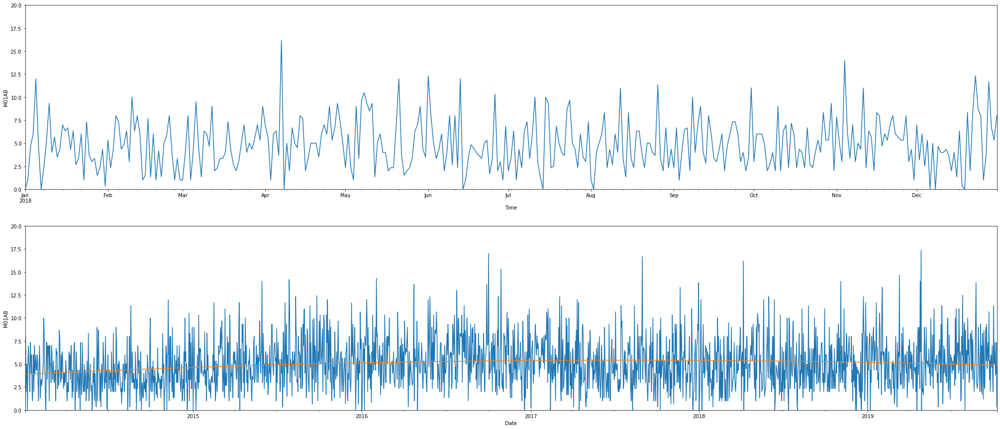

In [ ]:
# shorter and longer time series
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(35, 15))
M01AB_ts_1yr.plot(ax=axes[0])
M01AB_ts.plot(ax=axes[1])
for ax in axes:
    ax.set_xlabel('Time')
    ax.set_ylabel('M01AB')
    ax.set_ylim(0, 20)
M01AB_lm.predict(M01AB_df).plot(ax=axes[1])
plt.show()

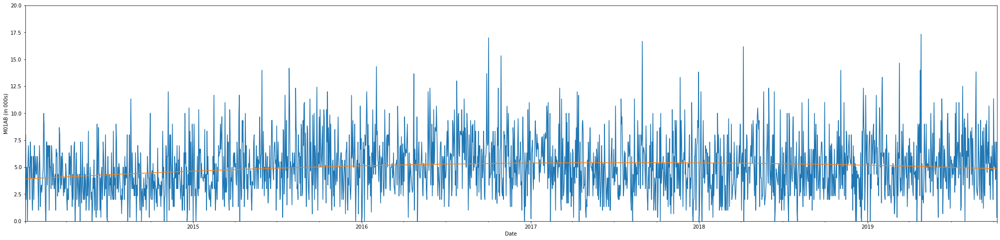

In [ ]:
# plot the time series
ax = M01AB_ts.plot(figsize= (35, 8))
ax.set_xlabel('Time')
ax.set_ylabel('M01AB (in 000s)')
ax.set_ylim(0, 20)
M01AB_lm.predict(M01AB_df).plot(ax=ax)
plt.show()

In [ ]:
nValid = 36
nTrain = len(M01AB_ts) - nValid
# partition the data
train_ts_M01AB = M01AB_ts[:nTrain]
valid_ts_M01AB = M01AB_ts[nTrain:]
# generate the naive and seasonal naive forecast
naive_pred_M01AB = pd.Series(train_ts_M01AB[-1], index=valid_ts_M01AB.index)
last_season_M01AB = train_ts_M01AB[-12:]
seasonal_pred_M01AB = pd.Series(pd.concat([last_season_M01AB]*5)[:len(valid_ts_M01AB)].values, index=valid_ts_M01AB.index)

In [ ]:
train_ts_M01AB

Date
2014-01-02    0.00
2014-01-03    8.00
2014-01-04    2.00
2014-01-05    4.00
2014-01-06    5.00
              ... 
2019-08-29    9.00
2019-08-30    6.34
2019-08-31    4.68
2019-09-01    2.00
2019-09-02    5.33
Name: M01AB_Sales, Length: 2070, dtype: float64

In [ ]:
valid_ts_M01AB

Date
2019-09-03     9.36
2019-09-04     2.00
2019-09-05     7.00
2019-09-06     1.68
2019-09-07     8.33
2019-09-08     7.01
2019-09-09     1.18
2019-09-10     8.66
2019-09-11     2.67
2019-09-12     2.33
2019-09-13     6.34
2019-09-14     8.99
2019-09-15     5.34
2019-09-16     9.33
2019-09-17     4.50
2019-09-18     6.33
2019-09-19     7.33
2019-09-20     5.34
2019-09-21    10.68
2019-09-22     3.33
2019-09-23     5.34
2019-09-24     2.00
2019-09-25     6.00
2019-09-26     5.50
2019-09-27     4.66
2019-09-28     7.00
2019-09-29     3.51
2019-09-30     2.00
2019-10-01    11.34
2019-10-02     5.18
2019-10-03     5.00
2019-10-04     7.34
2019-10-05     3.84
2019-10-06     4.00
2019-10-07     7.34
2019-10-08     0.33
Name: M01AB_Sales, dtype: float64

In [ ]:
naive_pred_M01AB

Date
2019-09-03    5.33
2019-09-04    5.33
2019-09-05    5.33
2019-09-06    5.33
2019-09-07    5.33
2019-09-08    5.33
2019-09-09    5.33
2019-09-10    5.33
2019-09-11    5.33
2019-09-12    5.33
2019-09-13    5.33
2019-09-14    5.33
2019-09-15    5.33
2019-09-16    5.33
2019-09-17    5.33
2019-09-18    5.33
2019-09-19    5.33
2019-09-20    5.33
2019-09-21    5.33
2019-09-22    5.33
2019-09-23    5.33
2019-09-24    5.33
2019-09-25    5.33
2019-09-26    5.33
2019-09-27    5.33
2019-09-28    5.33
2019-09-29    5.33
2019-09-30    5.33
2019-10-01    5.33
2019-10-02    5.33
2019-10-03    5.33
2019-10-04    5.33
2019-10-05    5.33
2019-10-06    5.33
2019-10-07    5.33
2019-10-08    5.33
dtype: float64

In [ ]:
last_season_M01AB

Date
2019-08-22     5.34
2019-08-23     9.67
2019-08-24    13.84
2019-08-25     3.00
2019-08-26     2.67
2019-08-27     2.34
2019-08-28     3.33
2019-08-29     9.00
2019-08-30     6.34
2019-08-31     4.68
2019-09-01     2.00
2019-09-02     5.33
Name: M01AB_Sales, dtype: float64

In [ ]:
seasonal_pred_M01AB

Date
2019-09-03     5.34
2019-09-04     9.67
2019-09-05    13.84
2019-09-06     3.00
2019-09-07     2.67
2019-09-08     2.34
2019-09-09     3.33
2019-09-10     9.00
2019-09-11     6.34
2019-09-12     4.68
2019-09-13     2.00
2019-09-14     5.33
2019-09-15     5.34
2019-09-16     9.67
2019-09-17    13.84
2019-09-18     3.00
2019-09-19     2.67
2019-09-20     2.34
2019-09-21     3.33
2019-09-22     9.00
2019-09-23     6.34
2019-09-24     4.68
2019-09-25     2.00
2019-09-26     5.33
2019-09-27     5.34
2019-09-28     9.67
2019-09-29    13.84
2019-09-30     3.00
2019-10-01     2.67
2019-10-02     2.34
2019-10-03     3.33
2019-10-04     9.00
2019-10-05     6.34
2019-10-06     4.68
2019-10-07     2.00
2019-10-08     5.33
dtype: float64

##### Naive and Seasonal Naive Forecasts in a 3-year validation set for M01AB

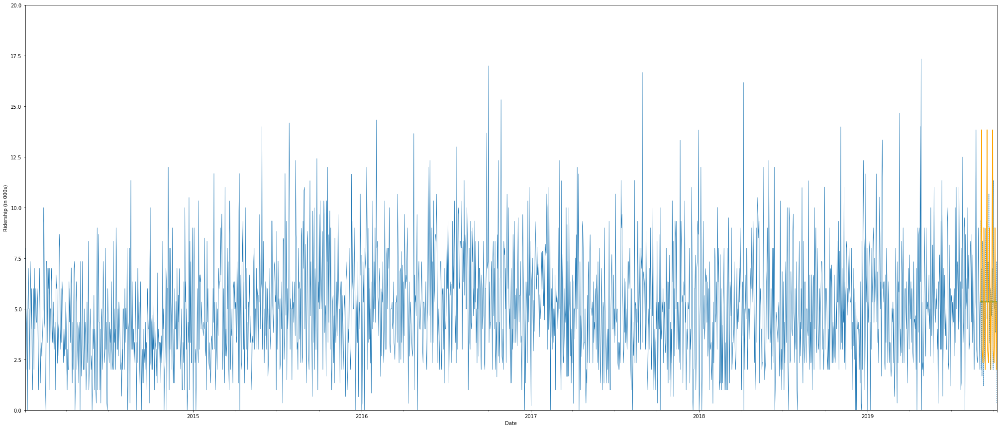

In [ ]:
# plot forecasts and actual in the training and validation sets
ax = train_ts_M01AB.plot(color='C0', linewidth=0.75, figsize= (35,15))
valid_ts_M01AB.plot(ax=ax, color='C0', linestyle='dashed', linewidth=0.75)
#ax.set_xlim('2015', '2016')
ax.set_ylim(0, 20)
ax.set_xlabel('Time')
ax.set_ylabel('Ridership (in 000s)')
naive_pred_M01AB.plot(ax=ax, color='green')
seasonal_pred_M01AB.plot(ax=ax, color='orange')

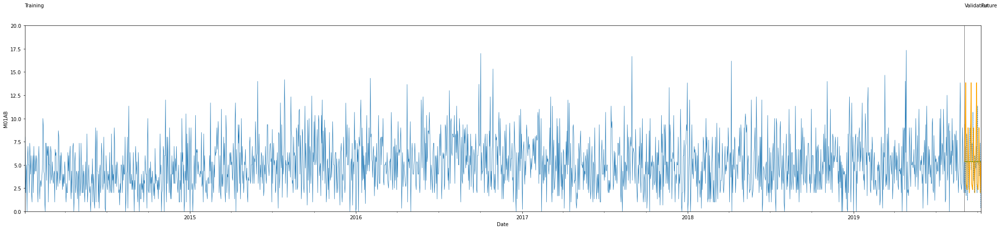

In [ ]:
# plot forecasts and actual in the training and validation sets
ax = train_ts_M01AB.plot(color='C0', linewidth=0.75, figsize= (35,7))
valid_ts_M01AB.plot(ax=ax, color='C0', linestyle='dashed', linewidth=0.75)
#ax.set_xlim('2015', '2016')
ax.set_ylim(0, 20)
ax.set_xlabel('Time')
ax.set_ylabel('M01AB')
naive_pred_M01AB.plot(ax=ax, color='green')
seasonal_pred_M01AB.plot(ax=ax, color='orange')

# determine coordinates for drawing the arrows and lines
one_month = pd.Timedelta('31 days')
xtrain = (min(train_ts_M01AB.index), max(train_ts_M01AB.index) - one_month)
xvalid = (min(valid_ts_M01AB.index) + one_month, max(valid_ts_M01AB.index) - one_month)
xfuture = (max(valid_ts_M01AB.index) + one_month, '2020')
xtv = xtrain[1] + 0.5 * (xvalid[0] - xtrain[1])
xvf = xvalid[1] + 0.5 * (xfuture[0] - xvalid[1])
ax.add_line(plt.Line2D(xtrain, (2450, 2450), color='black', linewidth=0.5))
ax.add_line(plt.Line2D(xvalid, (2450, 2450), color='black', linewidth=0.5))
ax.add_line(plt.Line2D(xfuture, (2450, 2450), color='black', linewidth=0.5))
ax.text('2014', 22, 'Training')
ax.text('2019-09-03', 22, 'Validation')
ax.text('2019-10-09', 22, 'Future')
ax.axvline(x=xtv, ymin=0, ymax=1, color='black', linewidth=0.5)
ax.axvline(x=xvf, ymin=0, ymax=1, color='black', linewidth=0.5)
plt.show()

##### Predictive accuracy of naive and seasonal naive forecasts in the validation and training set for M01AB

Table below compares the accuracies of these two naive forecasts.
Because M01AB has monthly seasonality, the seasonal
naive forecast is the clear winner on both training and validation and
on all popular measures. In choosing between the two models, the
accuracy on the validation set is more relevant than the accuracy on
the training set. Performance on the validation set is more indicative
of how the models will perform in the future.

###### Validation Set

In [ ]:
regressionSummary(valid_ts_M01AB, naive_pred_M01AB)


Regression statistics

                      Mean Error (ME) : 0.1731
       Root Mean Squared Error (RMSE) : 2.7432
            Mean Absolute Error (MAE) : 2.2325
          Mean Percentage Error (MPE) : -70.3831
Mean Absolute Percentage Error (MAPE) : 98.4098


In [ ]:
 regressionSummary(valid_ts_M01AB, seasonal_pred_M01AB)


Regression statistics

                      Mean Error (ME) : -0.1253
       Root Mean Squared Error (RMSE) : 4.5251
            Mean Absolute Error (MAE) : 3.6464
          Mean Percentage Error (MPE) : -75.0077
Mean Absolute Percentage Error (MAPE) : 121.3996


###### Training set

In [ ]:
# Calculate naive metrics for training set (shifted by 1 month)
regressionSummary(train_ts_M01AB[1:], train_ts_M01AB[:-1])


Regression statistics

               Mean Error (ME) : 0.0026
Root Mean Squared Error (RMSE) : 3.7529
     Mean Absolute Error (MAE) : 2.9228


In [ ]:
 # Calculate seasonal naive metrics for training set (shifted by 12 months)
regressionSummary(train_ts_M01AB[12:], train_ts_M01AB[:-12])


Regression statistics

               Mean Error (ME) : 0.0082
Root Mean Squared Error (RMSE) : 3.7524
     Mean Absolute Error (MAE) : 2.9416


### Regression Based Forecasting

In [ ]:
# fit a linear trend model to the time series
M01AB_df = tsatools.add_trend(M01AB_ts, trend='ct')
M01AB_df

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


,M01AB_Sales,const,trend
Date,,,
2014-01-02,0.00,1.0,1.0
2014-01-03,8.00,1.0,2.0
2014-01-04,2.00,1.0,3.0
2014-01-05,4.00,1.0,4.0
2014-01-06,5.00,1.0,5.0
...,...,...,...
2019-10-04,7.34,1.0,2102.0
2019-10-05,3.84,1.0,2103.0
2019-10-06,4.00,1.0,2104.0


#### Linear Regression

In [ ]:
nValid = 36
nTrain = len(M01AB_df) - nValid
# partition the data
train_df = M01AB_df[:nTrain]
valid_df = M01AB_df[nTrain:]

In [ ]:
train_df

,M01AB_Sales,const,trend
Date,,,
2014-01-02,0.00,1.0,1.0
2014-01-03,8.00,1.0,2.0
2014-01-04,2.00,1.0,3.0
2014-01-05,4.00,1.0,4.0
2014-01-06,5.00,1.0,5.0
...,...,...,...
2019-08-29,9.00,1.0,2066.0
2019-08-30,6.34,1.0,2067.0
2019-08-31,4.68,1.0,2068.0


In [ ]:
valid_df

,M01AB_Sales,const,trend
Date,,,
2019-09-03,9.36,1.0,2071.0
2019-09-04,2.00,1.0,2072.0
2019-09-05,7.00,1.0,2073.0
2019-09-06,1.68,1.0,2074.0
2019-09-07,8.33,1.0,2075.0
2019-09-08,7.01,1.0,2076.0
2019-09-09,1.18,1.0,2077.0
2019-09-10,8.66,1.0,2078.0
2019-09-11,2.67,1.0,2079.0


In [ ]:
M01AB_lm = sm.ols(formula='M01AB_Sales ~ trend', data=M01AB_df).fit()

In [ ]:
M01AB_lm_linear = sm.ols(formula='M01AB_Sales ~ trend', data=train_df).fit()
predict_df_linear = M01AB_lm_linear.predict(valid_df)

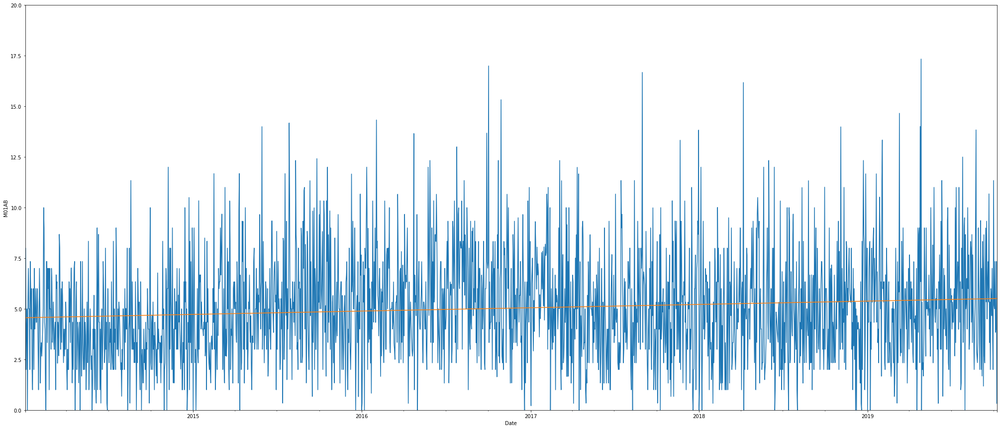

In [ ]:
# plot the time series
ax = M01AB_ts.plot(figsize= (35,15))
ax.set_xlabel('Time')
ax.set_ylabel('M01AB')
ax.set_ylim(0, 20)
M01AB_lm.predict(M01AB_df).plot(ax=ax)
plt.show()

##### A linear trend fit to M01AB in the training period and forecasted in the validation period


In [ ]:
# fit linear model using training set and predict on validation set
M01AB_lm = sm.ols(formula='M01AB_Sales ~ trend', data=train_df).fit()
predict_df = M01AB_lm.predict(valid_df)

### Single Graph Layout

In [ ]:
def singleGraphLayout(ax, ylim, train_df, valid_df):
    ax.set_xlim('2014', '2019-09')
    ax.set_ylim(*ylim)
    ax.set_xlabel('Time')
    one_month = pd.Timedelta('31 days')
    xtrain = (min(train_df.index), max(train_df.index) - one_month)
    xvalid = (min(valid_df.index) + one_month, max(valid_df.index) - one_month)
    xtv = xtrain[1] + 0.5 * (xvalid[0] - xtrain[1])
    ypos = 0.9 * ylim[1] + 0.1 * ylim[0]
    ax.add_line(plt.Line2D(xtrain, (ypos, ypos), color='black',linewidth=0.5))
    ax.add_line(plt.Line2D(xvalid, (ypos, ypos), color='black',linewidth=0.5))
    ax.axvline(x=xtv, ymin=0, ymax=1, color='black', linewidth=0.5)
    ypos = 0.925 * ylim[1] + 0.075 * ylim[0]
    ax.text('2014', ypos, 'Training')
    ax.text('2019-09-3', ypos, 'Validation')

### Graph Layout

In [ ]:
def graphLayout(axes, train_df, valid_df):
    singleGraphLayout(axes[0], [0, 20], train_df, valid_df)
    singleGraphLayout(axes[1], [-7, 13], train_df, valid_df)
    train_df.plot(y='M01AB_Sales', ax=axes[0], color='C0', linewidth=0.75)
    valid_df.plot(y='M01AB_Sales', ax=axes[0], color='C0', linestyle='dashed',
    linewidth=0.75)
    axes[1].axhline(y=0, xmin=0, xmax=1, color='black', linewidth=0.5)
    axes[0].set_xlabel('')
    axes[0].set_ylabel('M01AB_Sales')
    axes[1].set_ylabel('Forecast Errors')
    if axes[0].get_legend():
        axes[0].get_legend().remove()

In [ ]:
train_df

,M01AB_Sales,const,trend
Date,,,
2014-01-02,0.00,1.0,1.0
2014-01-03,8.00,1.0,2.0
2014-01-04,2.00,1.0,3.0
2014-01-05,4.00,1.0,4.0
2014-01-06,5.00,1.0,5.0
...,...,...,...
2019-08-29,9.00,1.0,2066.0
2019-08-30,6.34,1.0,2067.0
2019-08-31,4.68,1.0,2068.0


##### A linear trend fit to M01AB in the training period (a) and forecasted in the validation period (b)

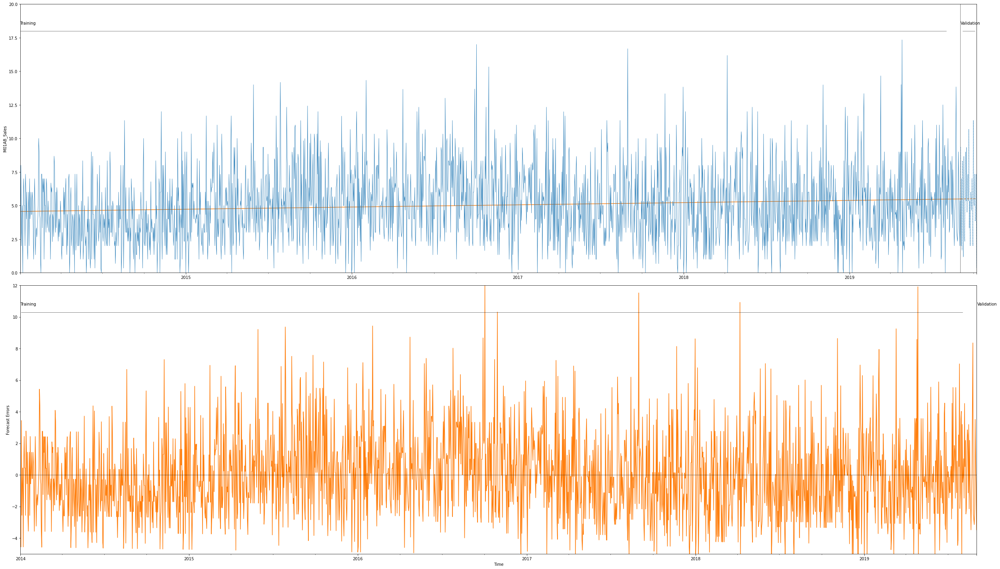

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(35, 20))
M01AB_lm.predict(train_df).plot(ax=axes[0], color='C1')
M01AB_lm.predict(valid_df).plot(ax=axes[0], color='C1', linestyle='dashed')
residual = train_df.M01AB_Sales - M01AB_lm.predict(train_df)
residual.plot(ax=axes[1], color='C1')
residual = valid_df.M01AB_Sales - M01AB_lm.predict(valid_df)
residual.plot(ax=axes[1], color='C1', linestyle='dashed')
graphLayout(axes, train_df, valid_df)
plt.tight_layout()
plt.show()

##### Summary

In [ ]:
M01AB_lm.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            M01AB_Sales   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     20.12
Date:                Mon, 13 Jun 2022   Prob (F-statistic):           7.69e-06
Time:                        09:36:11   Log-Likelihood:                -5010.8
No. Observations:                2070   AIC:                         1.003e+04
Df Residuals:                    2068   BIC:                         1.004e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.5601      0.120     38.064      0.000       4.325       4.795
trend          0.0004      0.000      4.485      0.000       0.000       0.001
==============================================================================
Omnibus:                      137.713   Durbin-Watson:                   1.899
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              168.796
Skew:                           0.635   Prob(JB):                     2.22e-37
Kurtosis:                       3.586   Cond. No.                     2.39e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.39e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Exponential Regression

In [ ]:
M01AB_lm_expo = sm.ols(formula='np.log(M01AB_Sales) ~ trend', data=train_df).fit()
predict_df_expo = M01AB_lm_expo.predict(valid_df)

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


##### Exponential (green) and linear (orange) trend used to forecast M01AB


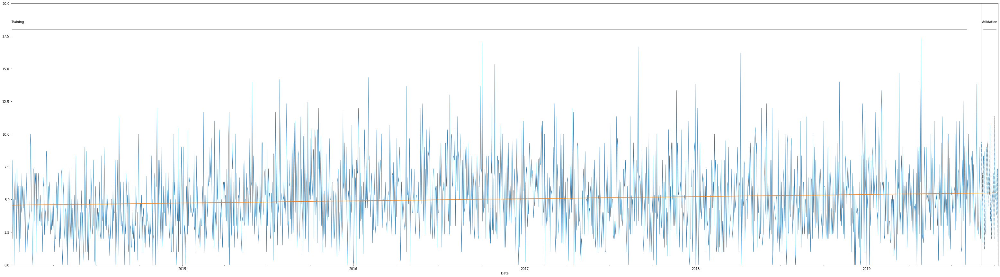

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(55,15))
train_df.plot(y='M01AB_Sales', ax=ax, color='C0', linewidth=0.75)
valid_df.plot(y='M01AB_Sales', ax=ax, color='C0', linestyle='dashed', linewidth=0.75)
singleGraphLayout(ax, [0, 20], train_df, valid_df)
M01AB_lm_linear.predict(train_df).plot(color='C1')
M01AB_lm_linear.predict(valid_df).plot(color='C1', linestyle='dashed')
M01AB_lm_expo.predict(train_df).apply(lambda row: math.exp(row)).plot(color='C2')
M01AB_lm_expo.predict(valid_df).apply(lambda row: math.exp(row)).plot(color='C2',  linestyle='dashed')
ax.get_legend().remove()
plt.show()

In [ ]:
M01AB_lm_expo.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     np.log(M01AB_Sales)   R-squared:                         nan
Model:                             OLS   Adj. R-squared:                    nan
Method:                  Least Squares   F-statistic:                       nan
Date:                 Mon, 13 Jun 2022   Prob (F-statistic):                nan
Time:                         09:51:53   Log-Likelihood:                    nan
No. Observations:                 2070   AIC:                               nan
Df Residuals:                     2068   BIC:                               nan
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept         nan        nan        nan        nan         nan         nan
trend             nan        nan        nan        nan         nan         nan
==============================================================================
Omnibus:                          nan   Durbin-Watson:                     nan
Prob(Omnibus):                    nan   Jarque-Bera (JB):                  nan
Skew:                             nan   Prob(JB):                          nan
Kurtosis:                         nan   Cond. No.                     2.39e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.39e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [ ]:
M01AB_df

,M01AB_Sales,const
Date,,
2014-01-02,0.00,1.0
2014-01-03,8.00,1.0
2014-01-04,2.00,1.0
2014-01-05,4.00,1.0
2014-01-06,5.00,1.0
...,...,...
2019-10-04,7.34,1.0
2019-10-05,3.84,1.0
2019-10-06,4.00,1.0


In [ ]:
M01AB_df = tsatools.add_trend(M01AB_ts, trend='ct')
M01AB_df

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


,M01AB_Sales,const,trend
Date,,,
2014-01-02,0.00,1.0,1.0
2014-01-03,8.00,1.0,2.0
2014-01-04,2.00,1.0,3.0
2014-01-05,4.00,1.0,4.0
2014-01-06,5.00,1.0,5.0
...,...,...,...
2019-10-04,7.34,1.0,2102.0
2019-10-05,3.84,1.0,2103.0
2019-10-06,4.00,1.0,2104.0


In [ ]:
M01AB_df

,M01AB_Sales,const,trend
Date,,,
2014-01-02,0.00,1.0,1.0
2014-01-03,8.00,1.0,2.0
2014-01-04,2.00,1.0,3.0
2014-01-05,4.00,1.0,4.0
2014-01-06,5.00,1.0,5.0
...,...,...,...
2019-10-04,7.34,1.0,2102.0
2019-10-05,3.84,1.0,2103.0
2019-10-06,4.00,1.0,2104.0


In [ ]:
nValid = 36
nTrain = len(M01AB_df) - nValid
# partition the data
train_df = M01AB_df[:nTrain]
valid_df = M01AB_df[nTrain:]

In [ ]:
train_df

,M01AB_Sales,const,trend
Date,,,
2014-01-02,0.00,1.0,1.0
2014-01-03,8.00,1.0,2.0
2014-01-04,2.00,1.0,3.0
2014-01-05,4.00,1.0,4.0
2014-01-06,5.00,1.0,5.0
...,...,...,...
2019-08-29,9.00,1.0,2066.0
2019-08-30,6.34,1.0,2067.0
2019-08-31,4.68,1.0,2068.0


## Polynomial Regression

##### Quadratic trend model used to forecast M01AB. Plots of fitted, forecasted, and actual values (a) and forecast errors (b)


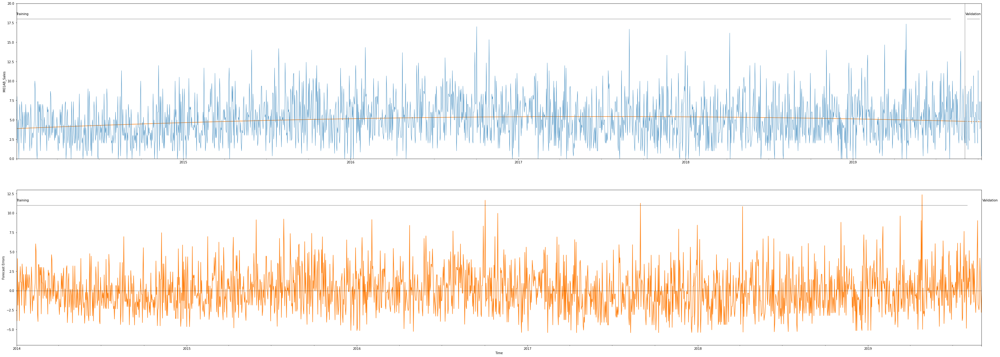

In [ ]:
M01AB_lm_poly = sm.ols(formula='M01AB_Sales ~ trend + np.square(trend)', data=train_df).fit()
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(55, 20))
M01AB_lm_poly.predict(train_df).plot(ax=axes[0], color='C1')
M01AB_lm_poly.predict(valid_df).plot(ax=axes[0], color='C1', linestyle='dashed')
residual = train_df.M01AB_Sales - M01AB_lm_poly.predict(train_df)
residual.plot(ax=axes[1], color='C1')
residual = valid_df.M01AB_Sales - M01AB_lm_poly.predict(valid_df)
residual.plot(ax=axes[1], color='C1', linestyle='dashed')
graphLayout(axes, train_df, valid_df)
plt.show()


##### Summary of Polynomial Regression with Quadratic Trend

In [ ]:
M01AB_lm_poly.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            M01AB_Sales   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     23.60
Date:                Mon, 13 Jun 2022   Prob (F-statistic):           7.36e-11
Time:                        09:49:36   Log-Likelihood:                -4997.4
No. Observations:                2070   AIC:                         1.000e+04
Df Residuals:                    2067   BIC:                         1.002e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.8699      0.179     21.656      0.000       3.519       4.220
trend                0.0024      0.000      6.143      0.000       0.002       0.003
np.square(trend) -9.651e-07   1.86e-07     -5.180      0.000   -1.33e-06      -6e-07
==============================================================================
Omnibus:                      136.147   Durbin-Watson:                   1.923
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              167.470
Skew:                           0.626   Prob(JB):                     4.31e-37
Kurtosis:                       3.610   Cond. No.                     5.76e+06
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.76e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

##### Summary of output from fitting additive seasonality to the M01AB data in the training period

In [ ]:
M01AB_df = tsatools.add_trend(M01AB_ts, trend='c')
M01AB_df['Month'] = M01AB_df.index.month
# partition the data
train_df = M01AB_df[:nTrain]
valid_df = M01AB_df[nTrain:]
M01AB_lm_season = sm.ols(formula='M01AB_Sales ~ C(Month)', data=train_df).fit()
M01AB_lm_season.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            M01AB_Sales   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.8905
Date:                Mon, 13 Jun 2022   Prob (F-statistic):              0.549
Time:                        09:39:19   Log-Likelihood:                -5015.9
No. Observations:                2070   AIC:                         1.006e+04
Df Residuals:                    2058   BIC:                         1.012e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          5.0223      0.201     24.952      0.000       4.628       5.417
C(Month)[T.2]     -0.0228      0.291     -0.078      0.938      -0.594       0.548
C(Month)[T.3]     -0.1102      0.284     -0.388      0.698      -0.668       0.447
C(Month)[T.4]      0.0956      0.287      0.334      0.739      -0.466       0.658
C(Month)[T.5]     -0.1762      0.284     -0.620      0.536      -0.734       0.381
C(Month)[T.6]     -0.3076      0.287     -1.073      0.283      -0.870       0.255
C(Month)[T.7]      0.1856      0.284      0.653      0.514      -0.372       0.743
C(Month)[T.8]      0.4060      0.284      1.428      0.153      -0.151       0.963
C(Month)[T.9]     -0.1069      0.300     -0.357      0.721      -0.695       0.481
C(Month)[T.10]    -0.0797      0.298     -0.267      0.789      -0.664       0.505
C(Month)[T.11]     0.2033      0.301      0.676      0.499      -0.387       0.793
C(Month)[T.12]    -0.0649      0.298     -0.218      0.828      -0.650       0.520
==============================================================================
Omnibus:                      142.033   Durbin-Watson:                   1.889
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              175.275
Skew:                           0.646   Prob(JB):                     8.70e-39
Kurtosis:                       3.603   Cond. No.                         12.5
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

##### Regression model with seasonality applied to the M01AB (a) and its forecast errors (b)

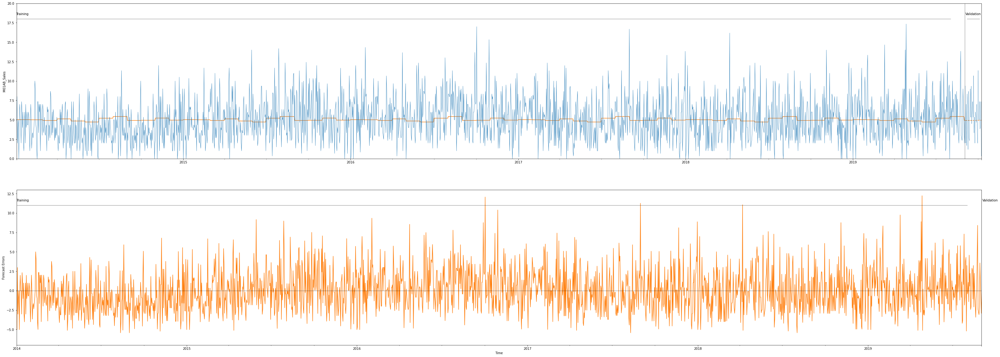

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(55, 20))
M01AB_lm_season.predict(train_df).plot(ax=axes[0], color='C1')
M01AB_lm_season.predict(valid_df).plot(ax=axes[0], color='C1', linestyle='dashed')
residual = train_df.M01AB_Sales - M01AB_lm_season.predict(train_df)
residual.plot(ax=axes[1], color='C1')
residual = valid_df.M01AB_Sales - M01AB_lm_season.predict(valid_df)
residual.plot(ax=axes[1], color='C1', linestyle='dashed')
graphLayout(axes, train_df, valid_df)
plt.show()

In [ ]:
train_df

,M01AB_Sales,const,Month
Date,,,
2014-01-02,0.00,1.0,1
2014-01-03,8.00,1.0,1
2014-01-04,2.00,1.0,1
2014-01-05,4.00,1.0,1
2014-01-06,5.00,1.0,1
...,...,...,...
2019-08-29,9.00,1.0,8
2019-08-30,6.34,1.0,8
2019-08-31,4.68,1.0,8


In [ ]:
M01AB_df

,M01AB_Sales,const,Month
Date,,,
2014-01-02,0.00,1.0,1
2014-01-03,8.00,1.0,1
2014-01-04,2.00,1.0,1
2014-01-05,4.00,1.0,1
2014-01-06,5.00,1.0,1
...,...,...,...
2019-10-04,7.34,1.0,10
2019-10-05,3.84,1.0,10
2019-10-06,4.00,1.0,10


In [ ]:
M01AB_df = tsatools.add_trend(M01AB_ts, trend='ct')
M01AB_df['Month'] = M01AB_df.index.month
# partition the data
train_df = M01AB_df[:nTrain]
valid_df = M01AB_df[nTrain:]

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
formula = 'M01AB_Sales ~ trend + np.square(trend) + C(Month)'
M01AB_lm_trendseason = sm.ols(formula=formula, data=train_df).fit()

##### Regression model with trend and seasonality applied to M01AB (a) and its forecast errors (b)


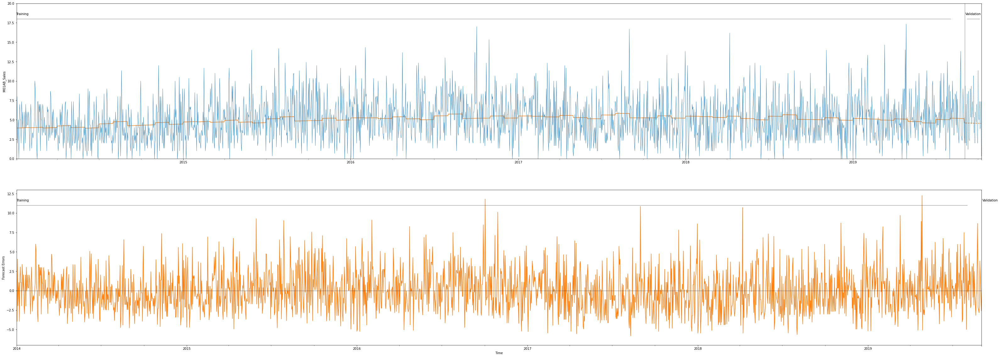

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(55, 20))
M01AB_lm_trendseason.predict(train_df).plot(ax=axes[0], color='C1')
M01AB_lm_trendseason.predict(valid_df).plot(ax=axes[0], color='C1', linestyle='dashed')
residual = train_df.M01AB_Sales - M01AB_lm_trendseason.predict(train_df)
residual.plot(ax=axes[1], color='C1')
residual = valid_df.M01AB_Sales - M01AB_lm_trendseason.predict(valid_df)
residual.plot(ax=axes[1], color='C1', linestyle='dashed')
graphLayout(axes, train_df, valid_df)
plt.show()

##### Summary of output from fitting trend and seasonality to M01AB in the training period

In [ ]:
M01AB_lm_trendseason.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            M01AB_Sales   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     4.433
Date:                Mon, 13 Jun 2022   Prob (F-statistic):           1.80e-07
Time:                        09:44:24   Log-Likelihood:                -4992.2
No. Observations:                2070   AIC:                         1.001e+04
Df Residuals:                    2056   BIC:                         1.009e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
====================================================================================
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.9320      0.254     15.459      0.000       3.433       4.431
C(Month)[T.2]       -0.0370      0.288     -0.129      0.898      -0.602       0.528
C(Month)[T.3]       -0.1398      0.281     -0.497      0.619      -0.691       0.412
C(Month)[T.4]        0.0505      0.284      0.178      0.859      -0.506       0.607
C(Month)[T.5]       -0.2348      0.281     -0.835      0.404      -0.787       0.317
C(Month)[T.6]       -0.3780      0.284     -1.332      0.183      -0.935       0.179
C(Month)[T.7]        0.1053      0.282      0.374      0.709      -0.447       0.658
C(Month)[T.8]        0.3175      0.282      1.126      0.260      -0.235       0.870
C(Month)[T.9]       -0.2555      0.297     -0.859      0.390      -0.839       0.328
C(Month)[T.10]      -0.2480      0.296     -0.838      0.402      -0.828       0.333
C(Month)[T.11]       0.0214      0.299      0.072      0.943      -0.564       0.607
C(Month)[T.12]      -0.2585      0.296     -0.873      0.383      -0.839       0.322
trend                0.0025      0.000      6.235      0.000       0.002       0.003
np.square(trend) -1.005e-06   1.89e-07     -5.309      0.000   -1.38e-06   -6.34e-07
==============================================================================
Omnibus:                      135.228   Durbin-Watson:                   1.934
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              166.110
Skew:                           0.624   Prob(JB):                     8.50e-37
Kurtosis:                       3.607   Cond. No.                     2.31e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.31e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Smoothing Methods


### Centered Moving Average for Visualization


In [ ]:
df_sales_monthly

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
0,2014-01-31,127.69,99.090,152.100,878.030,354.0,50.0,112.0,48.20
1,2014-02-28,133.32,126.050,177.000,1001.900,347.0,31.0,122.0,36.20
2,2014-03-31,137.44,92.950,147.655,779.275,232.0,20.0,112.0,85.40
3,2014-04-30,113.10,89.475,130.900,698.500,209.0,18.0,97.0,73.70
4,2014-05-31,101.79,119.933,132.100,628.780,270.0,23.0,107.0,123.70
...,...,...,...,...,...,...,...,...,...
65,2019-06-30,151.54,101.627,103.200,610.000,193.0,25.0,142.0,156.04
66,2019-07-31,181.00,103.541,92.800,649.800,250.6,20.0,115.0,105.20
67,2019-08-31,181.91,88.269,84.200,518.100,237.0,26.0,145.0,97.30
68,2019-09-30,161.07,111.437,93.500,984.480,227.8,16.0,161.0,109.10


In [ ]:
df_sales_daily

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00,2014,1,248,Thursday
1,1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00,2014,1,276,Friday
2,1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00,2014,1,276,Saturday
3,1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00,2014,1,276,Sunday
4,1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00,2014,1,276,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00,2019,10,276,Friday
2102,10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33,2019,10,276,Saturday
2103,10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20,2019,10,276,Sunday
2104,10/7/2019,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00,2019,10,276,Monday


In [ ]:
df_sales_daily_M01AB_datum = df_sales_daily[['datum', 'M01AB']]
df_sales_daily_M01AB_datum.head(10)

,datum,M01AB
0,1/2/2014,0.00
1,1/3/2014,8.00
2,1/4/2014,2.00
3,1/5/2014,4.00
4,1/6/2014,5.00
5,1/7/2014,0.00
6,1/8/2014,5.33
7,1/9/2014,7.00
8,1/10/2014,5.00
9,1/11/2014,5.00


In [ ]:
df_sales_daily_M01AB_datum['Date'] = pd.to_datetime(df_sales_daily_M01AB_datum.datum, format='%m/%d/%Y')
df_sales_daily_M01AB_datum.head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,datum,M01AB,Date
0,1/2/2014,0.00,2014-01-02
1,1/3/2014,8.00,2014-01-03
2,1/4/2014,2.00,2014-01-04
3,1/5/2014,4.00,2014-01-05
4,1/6/2014,5.00,2014-01-06
5,1/7/2014,0.00,2014-01-07
6,1/8/2014,5.33,2014-01-08
7,1/9/2014,7.00,2014-01-09
8,1/10/2014,5.00,2014-01-10
9,1/11/2014,5.00,2014-01-11


In [ ]:
df_sales_daily_M01AB_datum.tail(10)

,datum,M01AB,Date
2096,9/29/2019,3.51,2019-09-29
2097,9/30/2019,2.00,2019-09-30
2098,10/1/2019,11.34,2019-10-01
2099,10/2/2019,5.18,2019-10-02
2100,10/3/2019,5.00,2019-10-03
2101,10/4/2019,7.34,2019-10-04
2102,10/5/2019,3.84,2019-10-05
2103,10/6/2019,4.00,2019-10-06
2104,10/7/2019,7.34,2019-10-07
2105,10/8/2019,0.33,2019-10-08


In [ ]:
df_sales_daily_M01AB_datum.dtypes

datum            object
M01AB           float64
Date     datetime64[ns]
dtype: object

In [ ]:
df_sales_startmonth_M01AB = df_sales_daily_M01AB_datum.groupby([df_sales_daily_M01AB_datum.Date.dt.year, df_sales_daily_M01AB_datum.Date.dt.month]).last()
df_sales_startmonth_M01AB

datum  M01AB       Date
Date Date                             
2014 1     1/31/2014   1.00 2014-01-31
     2     2/28/2014   7.00 2014-02-28
     3     3/31/2014   5.34 2014-03-31
     4     4/30/2014   4.34 2014-04-30
     5     5/31/2014   5.67 2014-05-31
...              ...    ...        ...
2019 6     6/30/2019   6.00 2019-06-30
     7     7/31/2019   0.00 2019-07-31
     8     8/31/2019   4.68 2019-08-31
     9     9/30/2019   2.00 2019-09-30
     10    10/8/2019   0.33 2019-10-08

[70 rows x 3 columns]

In [ ]:
df_sales_startmonth_M01AB = df_sales_startmonth_M01AB[['datum', 'M01AB', 'Date']]
df_sales_startmonth_M01AB

datum  M01AB       Date
Date Date                             
2014 1     1/31/2014   1.00 2014-01-31
     2     2/28/2014   7.00 2014-02-28
     3     3/31/2014   5.34 2014-03-31
     4     4/30/2014   4.34 2014-04-30
     5     5/31/2014   5.67 2014-05-31
...              ...    ...        ...
2019 6     6/30/2019   6.00 2019-06-30
     7     7/31/2019   0.00 2019-07-31
     8     8/31/2019   4.68 2019-08-31
     9     9/30/2019   2.00 2019-09-30
     10    10/8/2019   0.33 2019-10-08

[70 rows x 3 columns]

In [ ]:
# Load data and convert to time series
M01AB_ts = pd.Series(df_sales_startmonth_M01AB.M01AB.values, index=df_sales_startmonth_M01AB.Date, name='M01AB_Sales')

In [ ]:
M01AB_ts.index = pd.DatetimeIndex(M01AB_ts.index, freq=M01AB_ts.index.inferred_freq)

In [ ]:
# Centered moving average with window size = 12
ma_centered = M01AB_ts.rolling(12, center=True).mean()

In [ ]:
# Trailing moving average with window size = 12
ma_trailing = M01AB_ts.rolling(12).mean()

### Centered moving average (smooth blue line) and trailing moving average (broken orange line) with window w = 12, overlaid on M01AB series

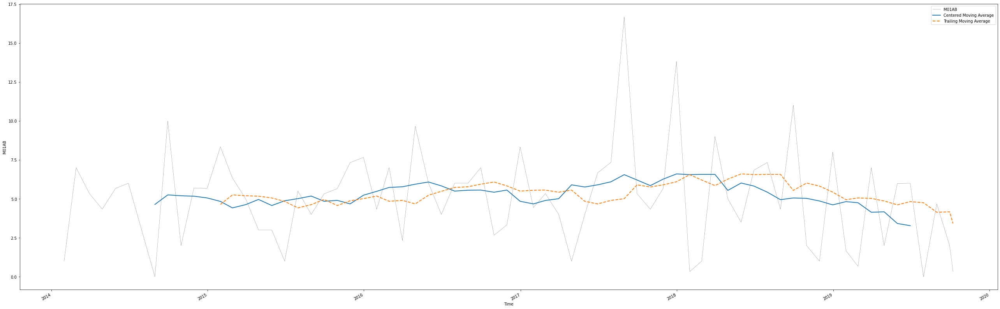

In [ ]:
# Shift the average by one time unit to get the next day predictions
ma_centered = pd.Series(ma_centered[:-1].values, index=ma_centered.index[1:])
ma_trailing = pd.Series(ma_trailing[:-1].values, index=ma_trailing.index[1:])
fig, ax = plt.subplots(figsize=(45, 15))
ax = M01AB_ts.plot(ax=ax, color='black', linewidth=0.25)
ma_centered.plot(ax=ax, linewidth=2)
ma_trailing.plot(ax=ax, style='--', linewidth=2)
ax.set_xlabel('Time')
ax.set_ylabel('M01AB')
ax.legend(['M01AB', 'Centered Moving Average', 'Trailing Moving Average'])
plt.show()

### Trailing Moving Average for Forecasting

In [ ]:
len(M01AB_ts)

70

In [ ]:
len(M01AB_ts)*0.8

56.0

In [ ]:
# partition the data
nValid = 20
nTrain = len(M01AB_ts) - nValid
train_ts = M01AB_ts[:nTrain]
valid_ts = M01AB_ts[nTrain:]

In [ ]:
# moving average on training
ma_trailing = train_ts.rolling(12).mean()
last_ma = ma_trailing[-1]

### Trailing moving average forecaster with w = 12 applied to M01AB series

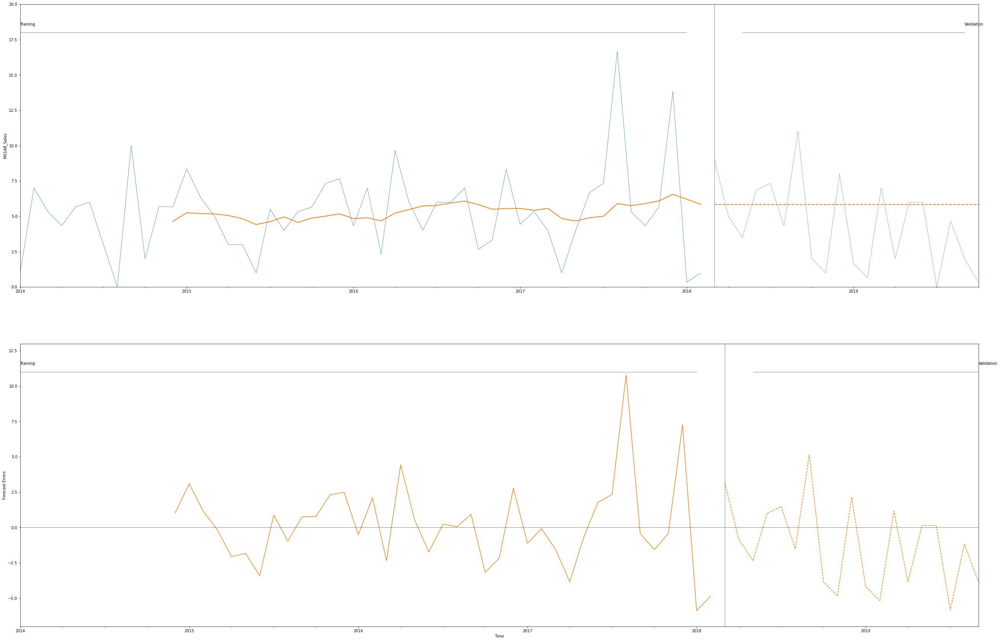

In [ ]:
# create forecast based on last moving average in the training period
ma_trailing_pred = pd.Series(last_ma, index=valid_ts.index)
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(45, 30))
ma_trailing.plot(ax=axes[0], linewidth=2, color='C1')
ma_trailing_pred.plot(ax=axes[0], linewidth=2, color='C1', linestyle='dashed')
residual = train_ts - ma_trailing
residual.plot(ax=axes[1], color='C1')
residual = valid_ts - ma_trailing_pred
residual.plot(ax=axes[1], color='C1', linestyle='dashed')
graphLayout(axes, train_ts, valid_ts)

### Applying Moving Average to the residuals from the regression model (which lack trend and seasonality), to forecast the April 2001 residual

In [ ]:
# Build a model with seasonality, trend, and quadratic trend
M01AB_df = tsatools.add_trend(M01AB_ts, trend='ct')
M01AB_df['Month'] = M01AB_df.index.month

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/tsatools.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  x = pd.concat(x[::order], 1)


In [ ]:
M01AB_df

,M01AB_Sales,const,trend,Month
Date,,,,
2014-01-31,1.00,1.0,1.0,1
2014-02-28,7.00,1.0,2.0,2
2014-03-31,5.34,1.0,3.0,3
2014-04-30,4.34,1.0,4.0,4
2014-05-31,5.67,1.0,5.0,5
...,...,...,...,...
2019-06-30,6.00,1.0,66.0,6
2019-07-31,0.00,1.0,67.0,7
2019-08-31,4.68,1.0,68.0,8


In [ ]:
# partition the data
train_df = M01AB_df[:nTrain]
valid_df = M01AB_df[nTrain:]
formula = 'M01AB_Sales ~ trend + np.square(trend) + C(Month)'
M01AB_lm_trendseason = sm.ols(formula=formula, data=train_df).fit()

In [ ]:
# create single-point forecast
M01AB_prediction = M01AB_lm_trendseason.predict(valid_df.iloc[0, :])

In [ ]:
# apply Moving Average to residuals
ma_trailing = M01AB_lm_trendseason.resid.rolling(12).mean()
print('Prediction', M01AB_prediction[0])
print('Moving_Average_trailing', ma_trailing[-1])

Prediction 4.67506136217944
Moving_Average_trailing 0.1758076470000467


## Simple Exponential Smoothing

### Output for simple exponential smoothing forecaster with = 0.2, applied to the series of residuals from the regression model (which lack trend and seasonality). The forecast value is ...

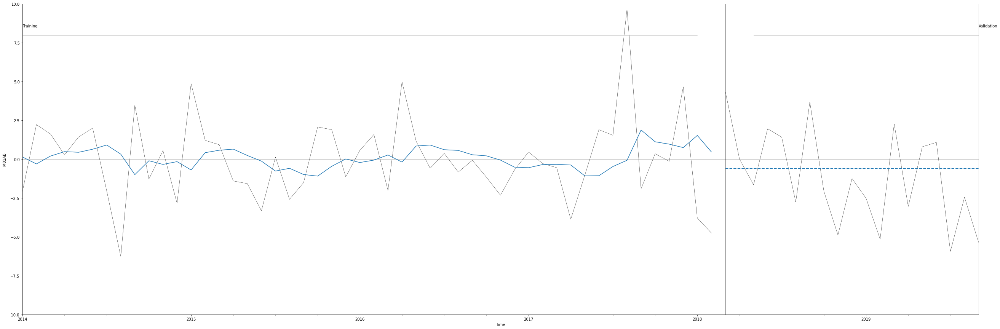

In [ ]:
residuals_ts = M01AB_lm_trendseason.resid
residuals_pred = valid_df.M01AB_Sales - M01AB_lm_trendseason.predict(valid_df)
fig, ax = plt.subplots(figsize=(45,15))
M01AB_lm_trendseason.resid.plot(ax=ax, color='black', linewidth=0.5)
residuals_pred.plot(ax=ax, color='black', linewidth=0.5)
ax.set_ylabel('M01AB')
ax.set_xlabel('Time')
ax.axhline(y=0, xmin=0, xmax=1, color='grey', linewidth=0.5)

# Run Exponential Smoothing
# with smoothing level alpha = 0.2
expSmooth = ExponentialSmoothing(residuals_ts, freq='M')
expSmoothFit = expSmooth.fit(smoothing_level=0.2)
expSmoothFit.fittedvalues.plot(ax=ax)
expSmoothFit.forecast(len(valid_ts)).plot(ax=ax, style='--', linewidth=2, color='C0')
singleGraphLayout(ax, [-10, 10], train_df, valid_df)

In [ ]:
expSmoothFit.fittedvalues

In [ ]:
expSmoothFit.forecast(len(valid_ts))

In [ ]:
residuals_ts

Date
2014-01-31   -2.111887
2014-02-28    2.228275
2014-03-31    1.623092
2014-04-30    0.281463
2014-05-31    1.434835
2014-06-30    2.005706
2014-07-31   -2.045922
2014-08-31   -6.265051
2014-09-30    3.483321
2014-10-31   -1.275807
2014-11-30    0.555064
2014-12-31   -2.834064
2015-01-31    4.866862
2015-02-28    1.213110
2015-03-31    0.934012
2015-04-30   -1.401531
2015-05-31   -1.572073
2015-06-30   -3.325116
2015-07-31    0.129341
2015-08-31   -2.583702
2015-09-30   -1.509245
2015-10-31    2.077713
2015-11-30    1.904670
2015-12-31   -1.138373
2016-01-31    0.568639
2016-02-29    1.590973
2016-03-31   -2.012040
2016-04-30    4.988503
2016-05-31    1.164046
2016-06-30   -0.582911
2016-07-31    0.377632
2016-08-31   -0.829326
2016-09-30   -0.068783
2016-10-31   -1.155740
2016-11-30   -2.322697
2016-12-31   -0.689654
2017-01-31    0.465110
2017-02-28   -0.278138
2017-03-31   -0.545064
2017-04-30   -3.868436
2017-05-31   -1.026807
2017-06-30    1.902321
2017-07-31    1.538949
2017-0

In [ ]:
expSmoothFit.forecast(len(valid_ts))

2018-03-31   -0.577178
2018-04-30   -0.577178
2018-05-31   -0.577178
2018-06-30   -0.577178
2018-07-31   -0.577178
2018-08-31   -0.577178
2018-09-30   -0.577178
2018-10-31   -0.577178
2018-11-30   -0.577178
2018-12-31   -0.577178
2019-01-31   -0.577178
2019-02-28   -0.577178
2019-03-31   -0.577178
2019-04-30   -0.577178
2019-05-31   -0.577178
2019-06-30   -0.577178
2019-07-31   -0.577178
2019-08-31   -0.577178
2019-09-30   -0.577178
2019-10-31   -0.577178
Freq: M, dtype: float64

## Advanced Exponential Smoothing

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/holtwinters.py:712: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  ConvergenceWarning)


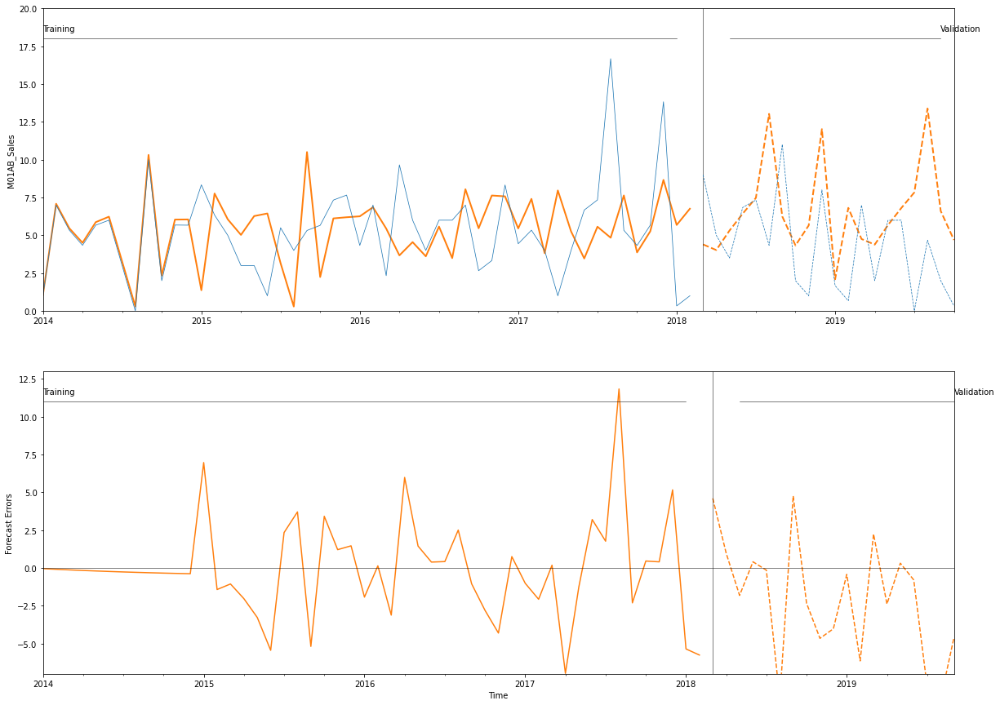

In [ ]:
# Run exponential smoothing with additive trend and additive seasonal
expSmooth = ExponentialSmoothing(train_ts, trend='additive', seasonal='additive', seasonal_periods=12, freq='M')
expSmoothFit = expSmooth.fit()
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(20, 15))
expSmoothFit.fittedvalues.plot(ax=axes[0], linewidth=2, color='C1')
expSmoothFit.forecast(len(valid_ts)).plot(ax=axes[0], linewidth=2, color='C1', linestyle='dashed')
residual = train_ts - expSmoothFit.fittedvalues
residual.plot(ax=axes[1], color='C1')
residual = valid_ts - expSmoothFit.forecast(len(valid_ts))
residual.plot(ax=axes[1], color='C1', linestyle='dashed')
graphLayout(axes, train_ts, valid_ts)

### Summary of a Holt-Winter’s exponential smoothing model applied to the M01AB data. Included are the initial and final states


In [ ]:
print(expSmoothFit.params)
print('AIC: ', expSmoothFit.aic)
print('AICc: ', expSmoothFit.aicc)
print('BIC: ', expSmoothFit.bic)

{'smoothing_level': 0.05263157894736842, 'smoothing_slope': 0.05263157894736842, 'smoothing_seasonal': 0.631578947368421, 'damping_slope': nan, 'initial_level': 3.6883333334, 'initial_slope': 0.044791666666666674, 'initial_seasons': array([-2.68833333,  3.31166667,  1.65166667,  0.65166667,  1.98166667,
        2.31166667, -0.68833333, -3.68833333,  6.31166667, -1.68833333,
        1.99166667,  1.98166667]), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}
AIC:  151.68538581061583
AICc:  173.74990193964808
BIC:  182.27775389746617


# Time Series Forecasting with Prophet

In [17]:
df_sales_daily

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00,2014,1,248,Thursday
1,1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00,2014,1,276,Friday
2,1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00,2014,1,276,Saturday
3,1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00,2014,1,276,Sunday
4,1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00,2014,1,276,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00,2019,10,276,Friday
2102,10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33,2019,10,276,Saturday
2103,10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20,2019,10,276,Sunday
2104,10/7/2019,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00,2019,10,276,Monday


In [31]:
df = df_sales_daily[["datum", "M01AB"]]
df

,datum,M01AB
0,1/2/2014,0.00
1,1/3/2014,8.00
2,1/4/2014,2.00
3,1/5/2014,4.00
4,1/6/2014,5.00
...,...,...
2101,10/4/2019,7.34
2102,10/5/2019,3.84
2103,10/6/2019,4.00
2104,10/7/2019,7.34


In [32]:
df['ds'] = pd.to_datetime(df.datum, format='%m/%d/%Y')
df.head(10)

,datum,M01AB,ds
0,1/2/2014,0.00,2014-01-02
1,1/3/2014,8.00,2014-01-03
2,1/4/2014,2.00,2014-01-04
3,1/5/2014,4.00,2014-01-05
4,1/6/2014,5.00,2014-01-06
5,1/7/2014,0.00,2014-01-07
6,1/8/2014,5.33,2014-01-08
7,1/9/2014,7.00,2014-01-09
8,1/10/2014,5.00,2014-01-10
9,1/11/2014,5.00,2014-01-11


In [33]:
df.rename({'M01AB': 'y'}, axis=1, inplace=True)
df

,datum,y,ds
0,1/2/2014,0.00,2014-01-02
1,1/3/2014,8.00,2014-01-03
2,1/4/2014,2.00,2014-01-04
3,1/5/2014,4.00,2014-01-05
4,1/6/2014,5.00,2014-01-06
...,...,...,...
2101,10/4/2019,7.34,2019-10-04
2102,10/5/2019,3.84,2019-10-05
2103,10/6/2019,4.00,2019-10-06
2104,10/7/2019,7.34,2019-10-07


In [34]:
df = df[['ds', 'y']]
df

,ds,y
0,2014-01-02,0.00
1,2014-01-03,8.00
2,2014-01-04,2.00
3,2014-01-05,4.00
4,2014-01-06,5.00
...,...,...
2101,2019-10-04,7.34
2102,2019-10-05,3.84
2103,2019-10-06,4.00
2104,2019-10-07,7.34


## Sub-daily data

Prophet can make forecasts for time series with sub-daily observations by passing in a dataframe with timestamps in the ds column. The format of the timestamps should be YYYY-MM-DD HH:MM:SS. When sub-daily data are used, daily seasonality will automatically be fit. 

05:50:42 - cmdstanpy - INFO - Chain [1] start processing
05:50:42 - cmdstanpy - INFO - Chain [1] done processing


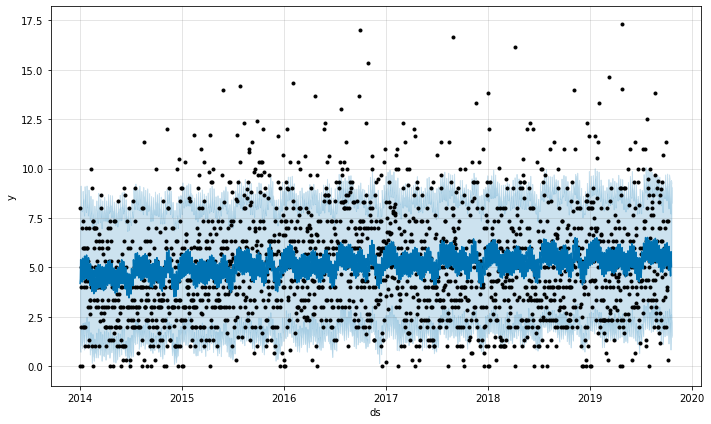

In [35]:
m = Prophet(changepoint_prior_scale=0.01).fit(df)
future = m.make_future_dataframe(periods=300, freq='H')
fcst = m.predict(future)
fig = m.plot(fcst)

The daily seasonality will show up in the components plot:

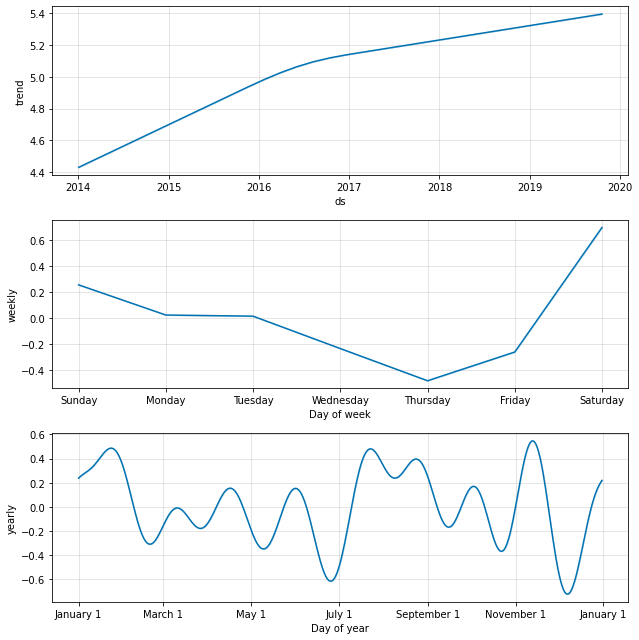

In [36]:
fig = m.plot_components(fcst)

## Data with regular gaps

05:51:40 - cmdstanpy - INFO - Chain [1] start processing
05:51:40 - cmdstanpy - INFO - Chain [1] done processing


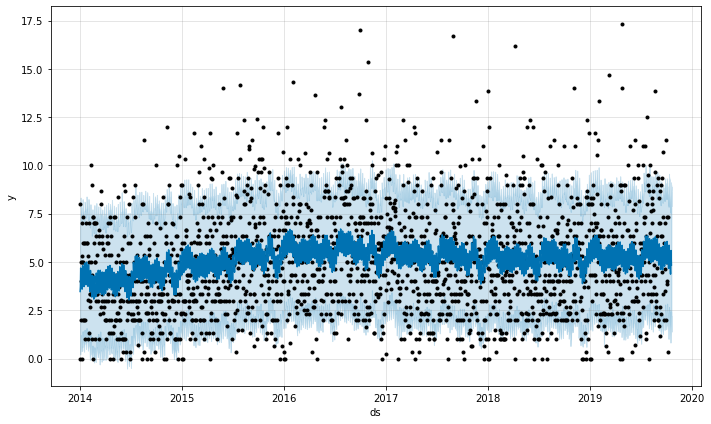

In [37]:
df2 = df.copy()
df2['ds'] = pd.to_datetime(df2['ds'])
df2 = df2[df2['ds'].dt.hour < 6]
m = Prophet().fit(df2)
future = m.make_future_dataframe(periods=300, freq='H')
fcst = m.predict(future)
fig = m.plot(fcst)

The forecast seems quite poor, with much larger fluctuations in the future than were seen in the history. The issue here is that we have fit a daily cycle to a time series that only has data for part of the day (12a to 6a). The daily seasonality is thus unconstrained for the remainder of the day and is not estimated well. The solution is to only make predictions for the time windows for which there are historical data. Here, that means to limit the future dataframe to have times from 12a to 6a:

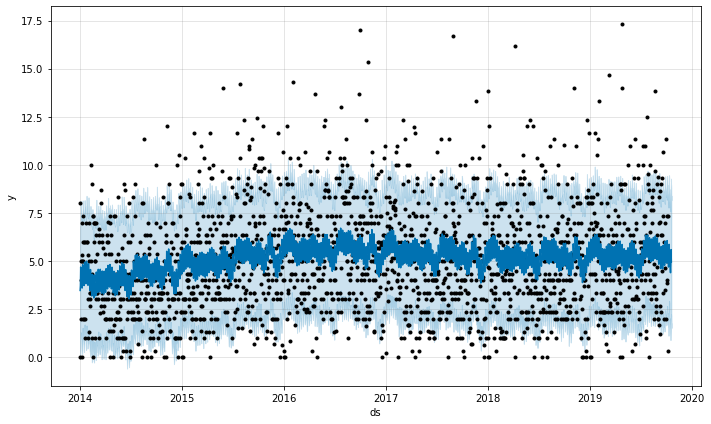

In [38]:
future2 = future.copy()
future2 = future2[future2['ds'].dt.hour < 6]
fcst = m.predict(future2)
fig = m.plot(fcst)

The same principle applies to other datasets with regular gaps in the data. For example, if the history contains only weekdays, then predictions should only be made for weekdays since the weekly seasonality will not be well estimated for the weekends.

## Monthly data

I can use Prophet to fit monthly data. However, the underlying model is continuous-time, which means that I can get strange results if I fit the model to monthly data and then ask for daily forecasts. Here I forecast Pharma sales volume for the next 10 years:

05:52:26 - cmdstanpy - INFO - Chain [1] start processing
05:52:26 - cmdstanpy - INFO - Chain [1] done processing


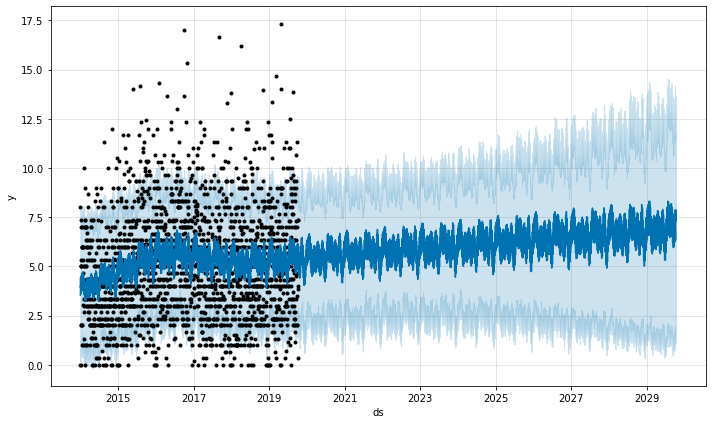

In [39]:
m = Prophet(seasonality_mode='multiplicative').fit(df)
future = m.make_future_dataframe(periods=3652)
fcst = m.predict(future)
fig = m.plot(fcst)

This is the same issue from above where the dataset has regular gaps. When I fit the yearly seasonality, it only has data for the first of each month and the seasonality components for the remaining days are unidentifiable and overfit. This can be clearly seen by doing MCMC to see uncertainty in the seasonality:

05:52:53 - cmdstanpy - INFO - CmdStan installation /usr/local/lib/python3.7/dist-packages/prophet/stan_model/cmdstan-2.26.1 missing makefile, cannot get version.
05:52:53 - cmdstanpy - INFO - Cannot determine whether version is before 2.28.
05:52:53 - cmdstanpy - INFO - CmdStan start processing
05:52:53 - cmdstanpy - INFO - Chain [1] start processing
05:52:53 - cmdstanpy - INFO - Chain [2] start processing
05:53:42 - cmdstanpy - INFO - Chain [1] done processing
05:53:42 - cmdstanpy - INFO - Chain [3] start processing
05:53:44 - cmdstanpy - INFO - Chain [2] done processing
05:53:44 - cmdstanpy - INFO - Chain [4] start processing
05:54:25 - cmdstanpy - INFO - Chain [3] done processing
05:54:35 - cmdstanpy - INFO - Chain [4] done processing
05:54:35 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in '/project/python/stan/prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_gl

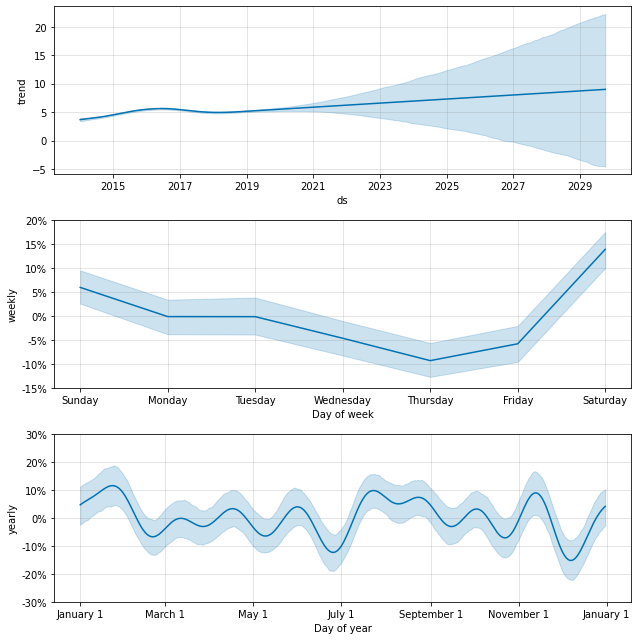

In [40]:
m = Prophet(seasonality_mode='multiplicative', mcmc_samples=300).fit(df, show_progress=False)
fcst = m.predict(future)
fig = m.plot_components(fcst)

The seasonality has low uncertainty at the start of each month where there are data points, but has very high posterior variance in between. When fitting Prophet to monthly data, only make monthly forecasts, which can be done by passing the frequency into make_future_dataframe:

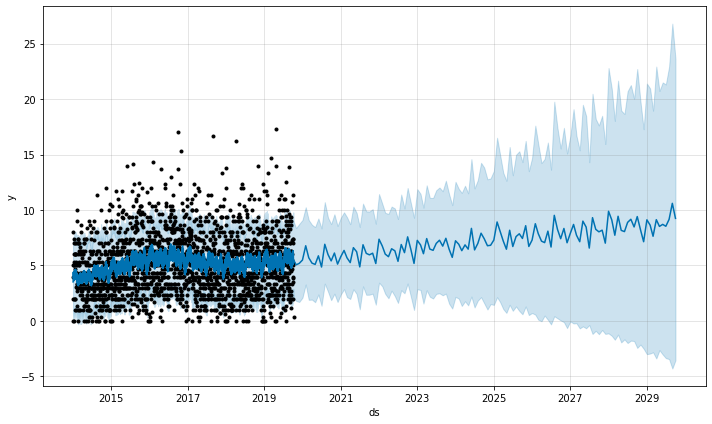

In [41]:
future = m.make_future_dataframe(periods=120, freq='MS')
fcst = m.predict(future)
fig = m.plot(fcst)

In Python, the frequency can be anything from the pandas list of frequency strings here: https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html#timeseries-offset-aliases . Note that MS used here is month-start, meaning the data point is placed on the start of each month.

In monthly data, yearly seasonality can also be modeled with binary extra regressors. In particular, the model can use 12 extra regressors like is_jan, is_feb, etc. where is_jan is 1 if the date is in Jan and 0 otherwise. This approach would avoid the within-month unidentifiability seen above. Be sure to use yearly_seasonality=False if monthly extra regressors are being added.

## Holidays with aggregated data
Holiday effects are applied to the particular date on which the holiday was specified. With data that has been aggregated to weekly or monthly frequency, holidays that don't fall on the particular date used in the data will be ignored: for example, a Monday holiday in a weekly time series where each data point is on a Sunday. To include holiday effects in the model, the holiday will need to be moved to the date in the history dataframe for which the effect is desired. Note that with weekly or monthly aggregated data, many holiday effects will be well-captured by the yearly seasonality, so added holidays may only be necessary for holidays that occur in different weeks throughout the time series.